In [1]:
!pip install ultralytics

Defaulting to user installation because normal site-packages is not writeable


In [1]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import yaml
%matplotlib inline

In [3]:
import zipfile
import os

# Path to your zip file
zip_path = 'Traffic.zip'  # Change to your actual ZIP filename

# Folder to extract to
extract_to = 'unzipped_data'

# Create the folder if it doesn't exist
os.makedirs(extract_to, exist_ok=True)

# Extract the zip
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'Unzipped to: {extract_to}')

Unzipped to: unzipped_data


In [4]:
root_dir = "unzipped_data"

for root, dirs, files in os.walk(root_dir):
    level = root.replace(root_dir, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")

unzipped_data/
  car/
    train/
      labels/
      images/
    valid/
      labels/
      images/
    test/
      labels/
      images/


In [5]:
yaml_path="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml"
with open(yaml_path,"r") as file:
    data=yaml.safe_load(file)
print(data)

{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 15, 'names': ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop'], 'roboflow': {'workspace': 'selfdriving-car-qtywx', 'project': 'self-driving-cars-lfjou', 'version': 6, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/selfdriving-car-qtywx/self-driving-cars-lfjou/dataset/6'}}


In [6]:
for idx, name in enumerate(data['names']):
    print(f"{idx}: {name}")

0: Green Light
1: Red Light
2: Speed Limit 10
3: Speed Limit 100
4: Speed Limit 110
5: Speed Limit 120
6: Speed Limit 20
7: Speed Limit 30
8: Speed Limit 40
9: Speed Limit 50
10: Speed Limit 60
11: Speed Limit 70
12: Speed Limit 80
13: Speed Limit 90
14: Stop


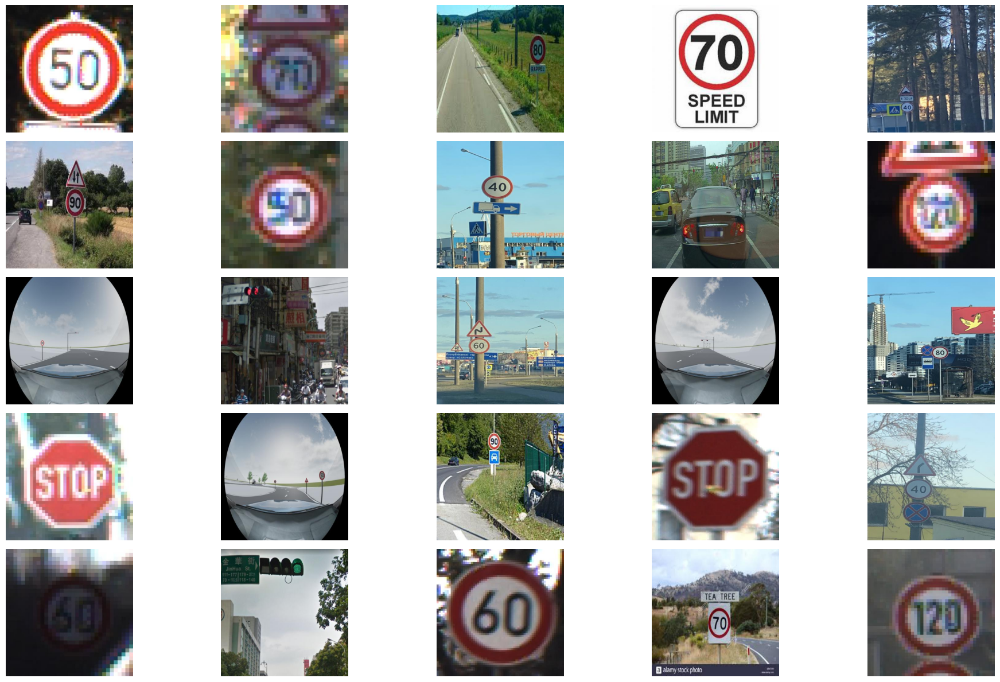

In [7]:
train_images_dir = "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/images/"

# Get list of image files
image_files = [f for f in os.listdir(train_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pick 25 random images (or less if not enough)
sample_files = random.sample(image_files, min(25, len(image_files)))

plt.figure(figsize=(20,12))

for i, img_name in enumerate(sample_files, 1):
    img_path = os.path.join(train_images_dir, img_name)
    img = Image.open(img_path)
    plt.subplot(5,5,i)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()

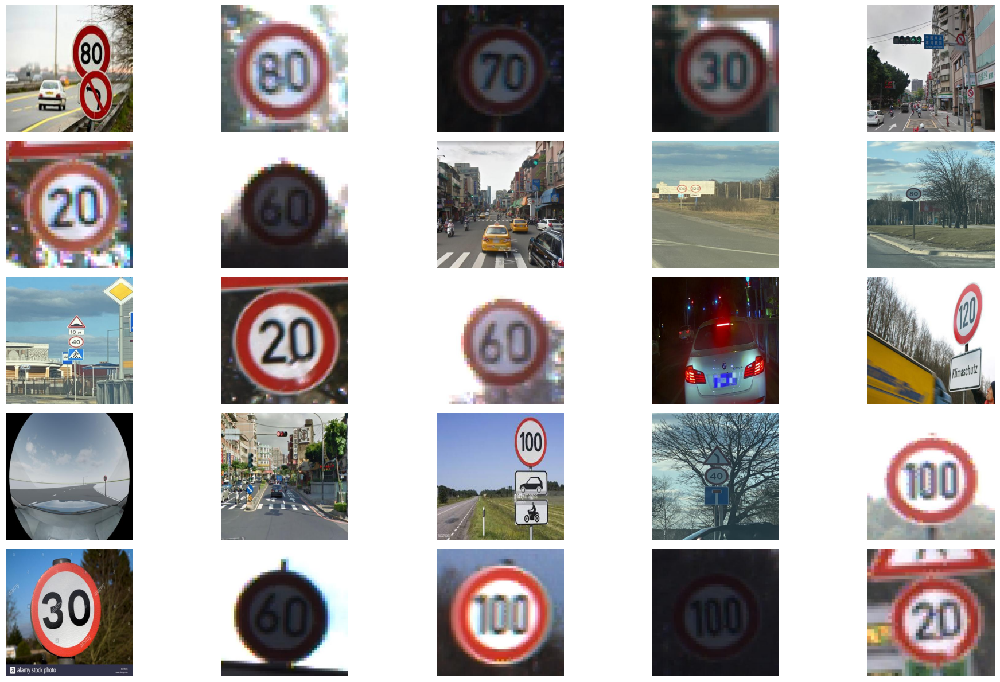

In [8]:
valid_images_dir = "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/images/"

# Get list of image files
image_files = [f for f in os.listdir(valid_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Pick 25 random images (or less if not enough)
sample_files = random.sample(image_files, min(25, len(image_files)))

plt.figure(figsize=(20,12))

for i, img_name in enumerate(sample_files, 1):
    img_path = os.path.join(valid_images_dir, img_name)
    img = Image.open(img_path)
    plt.subplot(5,5,i)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()

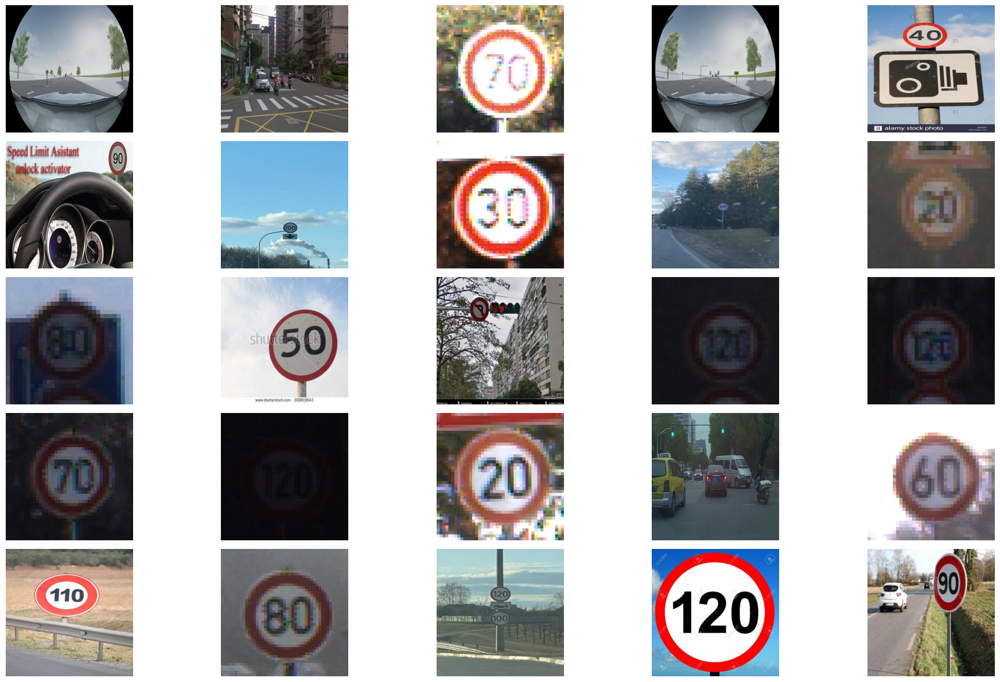

In [9]:
test_images_dir = "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/test/images/"

# List image files
image_files = [f for f in os.listdir(test_images_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Sample 25 images or less if not enough
sample_files = random.sample(image_files, min(25, len(image_files)))

plt.figure(figsize=(20,12))

for i, img_name in enumerate(sample_files, 1):
    img_path = os.path.join(test_images_dir, img_name)
    img = Image.open(img_path)
    plt.subplot(5,5,i)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()

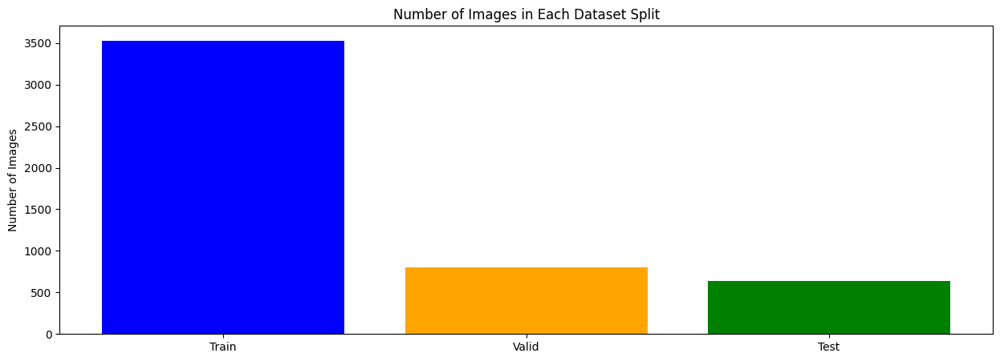

In [10]:
train_dir = "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/images/"
valid_dir = "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/images/"
test_dir = "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/test/images/"

# Count images in each folder
train_count = len([f for f in os.listdir(train_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
valid_count = len([f for f in os.listdir(valid_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
test_count = len([f for f in os.listdir(test_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Plotting
plt.figure(figsize=(15,5))
plt.bar(['Train', 'Valid', 'Test'], [train_count, valid_count, test_count], color=['blue', 'orange', 'green'])
plt.title('Number of Images in Each Dataset Split')
plt.ylabel('Number of Images')
plt.show()

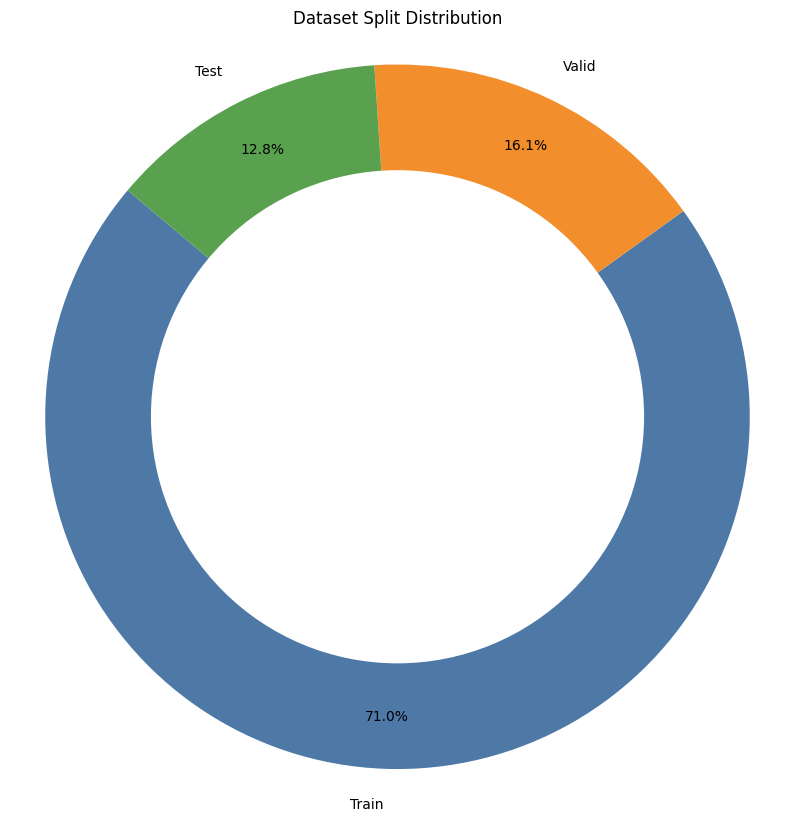

In [12]:
labels = ['Train', 'Valid', 'Test']
counts = [train_count, valid_count, test_count]
colors = ['#4e79a7', '#f28e2b', '#59a14f']

# Plot donut chart
plt.figure(figsize=(10,10))
wedges, texts, autotexts = plt.pie(counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140, pctdistance=0.85)

# Draw circle for donut shape
centre_circle = plt.Circle((0,0),0.70,fc='white')
plt.gca().add_artist(centre_circle)

plt.title('Dataset Split Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

## Model Training on YOLOV8

In [2]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov8m.pt')  

# Training The Final Model
Result_Final_model = Final_model.train(data="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml",
epochs = 70,
batch = -1,
optimizer = 'auto')

100%|██████████| 49.7M/49.7M [00:00<00:00, 82.2MB/s]


Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml, degrees=0.0, deterministic=True, device=0,1,2,3, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train16, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=

train: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1.2±0.8 MB/s, size: 24.4 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train16/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs/detect/train16
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      3.27G     0.8933      3.004      1.216          7        640: 100%|██████████| 221/221 [00:56<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:14<00:00,  7.02it/s]


                   all        801        944      0.232       0.55      0.307      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      3.34G     0.8395       1.93      1.158          6        640: 100%|██████████| 221/221 [00:53<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.376      0.562      0.427      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      3.34G     0.8241      1.686      1.131          7        640: 100%|██████████| 221/221 [00:52<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.64it/s]


                   all        801        944      0.485        0.5      0.462       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      3.34G     0.8067      1.563       1.14          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.659      0.622      0.605      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      3.34G     0.7725      1.419      1.104          6        640: 100%|██████████| 221/221 [00:52<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.673      0.642      0.669      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      3.41G     0.7396      1.271      1.089          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944      0.737      0.726      0.764      0.619

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      3.47G     0.7341       1.18      1.078          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.71it/s]


                   all        801        944      0.815       0.75      0.831      0.678

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      3.47G     0.7167      1.116      1.068         12        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.68it/s]


                   all        801        944      0.866      0.736      0.848      0.701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      3.47G     0.6947      1.037      1.057         13        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.69it/s]


                   all        801        944      0.874      0.778      0.865      0.725

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      3.47G     0.6836      1.036      1.049          6        640: 100%|██████████| 221/221 [00:52<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.836      0.769      0.856      0.718

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      3.47G     0.6728     0.9818      1.047          2        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.922      0.784      0.886      0.739

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      3.54G     0.6456     0.9371      1.023          7        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.878      0.801      0.889      0.754

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      3.54G     0.6555     0.9231      1.042          7        640: 100%|██████████| 221/221 [00:53<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.902       0.85      0.915      0.769

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      3.54G     0.6597     0.8597      1.022          8        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.74it/s]


                   all        801        944      0.913      0.823       0.89      0.749

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      3.54G     0.6574     0.8307      1.032          9        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.35it/s]


                   all        801        944      0.921      0.846      0.925      0.764

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      3.54G      0.648     0.8588      1.021          7        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.71it/s]


                   all        801        944       0.87      0.859      0.903      0.753

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      3.54G     0.6337     0.8276      1.019          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944       0.94       0.85      0.925      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      3.54G     0.6416     0.8207       1.02          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.58it/s]


                   all        801        944      0.907      0.862      0.922      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      3.54G     0.6406     0.8118      1.017         10        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944      0.903      0.885      0.932      0.771

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      3.54G     0.6205     0.7865     0.9984         10        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.51it/s]


                   all        801        944      0.942      0.847      0.934       0.79

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      3.54G     0.6126     0.7635       1.02          8        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.883      0.856      0.925      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      3.54G      0.603     0.7257      1.007          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.916      0.893       0.94      0.793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      3.54G     0.5939     0.7161      1.013          8        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.57it/s]


                   all        801        944      0.942       0.87      0.941      0.797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      3.54G     0.5846     0.6758      1.006          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944       0.94      0.873      0.945      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      3.54G     0.5846     0.6708     0.9842          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.942      0.868      0.944      0.802

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      3.54G      0.564     0.6902      1.002          8        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.55it/s]


                   all        801        944      0.913      0.873      0.935      0.795

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      3.54G     0.5707     0.6545     0.9829          6        640: 100%|██████████| 221/221 [00:52<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.50it/s]


                   all        801        944      0.924      0.899      0.943      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      3.54G      0.622     0.7363      1.008          6        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.71it/s]


                   all        801        944      0.941      0.889      0.947      0.808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      3.54G     0.5888     0.6954          1          6        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.66it/s]


                   all        801        944      0.928      0.902       0.95      0.803

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      3.54G     0.5721       0.68     0.9914          9        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.37it/s]


                   all        801        944      0.938      0.903      0.955      0.806

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      3.54G     0.5861     0.6583      0.986         10        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.53it/s]


                   all        801        944      0.965      0.884      0.957      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      3.54G     0.5932      0.665     0.9882          8        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.946      0.904       0.96      0.815

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      3.54G     0.5763     0.6489     0.9941          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.38it/s]


                   all        801        944      0.969      0.892      0.959      0.813

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      3.54G      0.563      0.672     0.9909          5        640: 100%|██████████| 221/221 [00:53<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.47it/s]


                   all        801        944      0.938      0.902      0.958      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      3.54G     0.5688     0.6078     0.9812          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.66it/s]


                   all        801        944      0.948      0.907      0.954      0.813

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      3.54G       0.56     0.6087     0.9871          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.55it/s]


                   all        801        944      0.937      0.914      0.955      0.813

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      3.54G     0.5447     0.6524     0.9753         11        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.35it/s]


                   all        801        944      0.928      0.911      0.955      0.818

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      3.54G     0.5461      0.568     0.9664          3        640: 100%|██████████| 221/221 [00:54<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.65it/s]


                   all        801        944      0.926      0.925      0.958       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      3.54G     0.5562     0.6078     0.9825          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.62it/s]


                   all        801        944      0.941      0.915      0.957      0.811

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      3.54G     0.5529     0.5743     0.9765          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.48it/s]


                   all        801        944      0.951      0.929      0.967      0.824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      3.54G     0.5486     0.5898     0.9709          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.928      0.922      0.964      0.824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      3.54G     0.5489     0.5961     0.9858          7        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.71it/s]


                   all        801        944       0.96      0.928       0.97      0.827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      3.54G     0.5555     0.5641     0.9742          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.52it/s]


                   all        801        944      0.962      0.931      0.967      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      3.54G     0.5263     0.5767     0.9654          8        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.953      0.927      0.968      0.827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      3.54G     0.5318     0.5626     0.9807          9        640: 100%|██████████| 221/221 [00:52<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.954      0.926      0.966      0.825

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      3.54G     0.5256     0.5742     0.9591         11        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.68it/s]


                   all        801        944      0.919      0.924      0.954      0.818

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      3.54G     0.5305      0.563     0.9734          5        640: 100%|██████████| 221/221 [00:55<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.948      0.936      0.967      0.829

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      3.54G     0.5337     0.5612     0.9759          6        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944      0.944      0.932      0.964       0.83

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      3.54G     0.5245     0.5622     0.9592          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.44it/s]


                   all        801        944      0.959      0.927      0.966      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      3.54G     0.5356     0.5333     0.9649          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944      0.949      0.937      0.966      0.829

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      3.54G     0.5194     0.5276     0.9729          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.68it/s]


                   all        801        944      0.963      0.932      0.968      0.827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      3.54G     0.5094     0.5218     0.9507          6        640: 100%|██████████| 221/221 [00:58<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.42it/s]


                   all        801        944      0.973      0.925      0.968      0.829

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      3.54G     0.5251     0.5252     0.9702         13        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.71it/s]


                   all        801        944      0.953      0.923      0.968      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      3.54G     0.4972     0.5096     0.9489         16        640: 100%|██████████| 221/221 [00:52<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.71it/s]


                   all        801        944      0.941       0.94      0.968      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      3.54G     0.5144     0.5131     0.9632          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.68it/s]


                   all        801        944      0.973      0.918      0.966      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      3.54G     0.5082     0.5317     0.9507          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.65it/s]


                   all        801        944      0.969       0.93      0.968      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      3.54G     0.4953     0.4916     0.9505          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.38it/s]


                   all        801        944      0.953      0.922      0.969      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      3.54G     0.5198     0.5135     0.9607         10        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944      0.954      0.939       0.97      0.839

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      3.54G     0.4984     0.5072     0.9486          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.69it/s]


                   all        801        944      0.952      0.943      0.971       0.84

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      3.54G     0.4899      0.498     0.9498          6        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.66it/s]


                   all        801        944      0.932      0.948      0.969      0.839
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      3.54G     0.4881     0.2715     0.9091          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944      0.948      0.949      0.972      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      3.54G      0.472     0.2682     0.9109          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.70it/s]


                   all        801        944      0.945      0.951      0.973      0.843

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      3.54G     0.4801     0.2885     0.9011          5        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.64it/s]


                   all        801        944      0.941      0.946      0.968      0.843

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      3.54G     0.4931     0.2694     0.8991          5        640: 100%|██████████| 221/221 [00:59<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.68it/s]


                   all        801        944      0.962      0.937      0.971      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      3.54G     0.4701      0.267     0.9019          7        640: 100%|██████████| 221/221 [00:52<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.951       0.95       0.97      0.842

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      3.54G      0.482     0.2724     0.9076          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.41it/s]


                   all        801        944      0.941      0.959       0.97      0.842

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70       3.6G     0.4441     0.2556     0.8956          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.73it/s]


                   all        801        944      0.955      0.954      0.973      0.844

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70       3.6G     0.4514      0.245     0.8991          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.72it/s]


                   all        801        944      0.944      0.963      0.973      0.847

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70       3.6G     0.4565     0.2482     0.8819          4        640: 100%|██████████| 221/221 [00:52<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.48it/s]


                   all        801        944      0.948      0.955      0.972      0.848

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70       3.6G     0.4513     0.2509     0.9086          3        640: 100%|██████████| 221/221 [00:52<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:13<00:00,  7.71it/s]


                   all        801        944       0.95      0.961      0.973      0.847

70 epochs completed in 1.343 hours.
Optimizer stripped from runs/detect/train16/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train16/weights/best.pt, 52.0MB

Validating runs/detect/train16/weights/best.pt...
Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:1 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:2 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:3 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:12<00:00,  7.85it/s]


                   all        801        944      0.948      0.956      0.972      0.848
           Green Light         87        122      0.884      0.874      0.906      0.568
             Red Light         74        108      0.798       0.84      0.828       0.53
       Speed Limit 100         52         52      0.934          1      0.991      0.914
       Speed Limit 110         17         17      0.925      0.941      0.987      0.901
       Speed Limit 120         60         60      0.986          1      0.995      0.925
        Speed Limit 20         56         56      0.967      0.982      0.987      0.863
        Speed Limit 30         71         74      0.947      0.972      0.992      0.928
        Speed Limit 40         53         55      0.982          1      0.995      0.893
        Speed Limit 50         68         71      0.973      0.944      0.989      0.871
        Speed Limit 60         76         76      0.961       0.96      0.986      0.907
        Speed Limit 7

### Finetuning the model

In [2]:
# Load the trained model weights
fine_tune_model = YOLO("/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train16/weights/best.pt")  # adjust path as needed

# Fine-tune with learning rate scheduler
fine_tune_model.train(
    data="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml",
    epochs=13,
    batch=16,
    lr0=1e-3,               # Try a slightly higher learning rate
    lrf=0.1,                # Apply learning rate decay
    optimizer="SGD",
    patience=10,
    device=0
)


Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=13, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train16/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train21, nbs=64, nms=False, opset=None, op

train: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 0.9±0.8 MB/s, size: 20.7 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train21/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train21
Starting training for 13 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/13      7.76G     0.4668     0.4573     0.9357         28        640: 100%|██████████| 221/221 [02:29<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:11<00:00,  2.28it/s]

                   all        801        944      0.955      0.948       0.97      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/13      7.86G     0.4675     0.4485     0.9277         29        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

                   all        801        944      0.946      0.954      0.971      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/13      7.86G     0.4777     0.4571     0.9335         17        640: 100%|██████████| 221/221 [02:29<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.37it/s]

                   all        801        944       0.96      0.948      0.972      0.847


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/13      7.95G      0.455     0.2608     0.8941         11        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.37it/s]

                   all        801        944      0.942      0.942      0.968      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/13      8.13G     0.4612     0.2686     0.8916         12        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

                   all        801        944      0.954       0.94       0.97      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/13      7.86G     0.4576     0.2639     0.8925         12        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

                   all        801        944      0.953      0.956      0.972      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/13      8.14G     0.4522     0.2565     0.8877         13        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:11<00:00,  2.35it/s]

                   all        801        944      0.952      0.936      0.965      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/13      8.13G     0.4475     0.2602     0.8864         11        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.38it/s]

                   all        801        944      0.956      0.936       0.97       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/13      8.12G     0.4448     0.2497     0.8835         16        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

                   all        801        944      0.956      0.944      0.969      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/13      7.87G     0.4416     0.2505     0.8863         10        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.40it/s]

                   all        801        944      0.964       0.94       0.97      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/13      8.12G     0.4411     0.2472     0.8878         10        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.39it/s]

                   all        801        944      0.954      0.954       0.97      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/13      7.96G     0.4343     0.2408     0.8874          9        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.38it/s]

                   all        801        944      0.949      0.952      0.968      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/13      8.14G     0.4335     0.2415     0.8828         11        640: 100%|██████████| 221/221 [02:28<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:11<00:00,  2.34it/s]

                   all        801        944      0.956      0.952       0.97      0.849



13 epochs completed in 0.584 hours.
Optimizer stripped from runs/detect/train21/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train21/weights/best.pt, 52.0MB

Validating runs/detect/train21/weights/best.pt...
Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:11<00:00,  2.26it/s]


                   all        801        944      0.957      0.935       0.97       0.85
           Green Light         87        122      0.847      0.869      0.892      0.554
             Red Light         74        108      0.832      0.731      0.829      0.537
       Speed Limit 100         52         52      0.934      0.981      0.988      0.921
       Speed Limit 110         17         17      0.982      0.882      0.977      0.888
       Speed Limit 120         60         60      0.994          1      0.995      0.924
        Speed Limit 20         56         56      0.978      0.982      0.987      0.887
        Speed Limit 30         71         74      0.947      0.959      0.991      0.928
        Speed Limit 40         53         55      0.982      0.973      0.993      0.894
        Speed Limit 50         68         71      0.985      0.926      0.989      0.881
        Speed Limit 60         76         76      0.973      0.949      0.985      0.913
        Speed Limit 7

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7229dc659040>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.0

### Training model on YOLO11l

In [ ]:
# Build from YAML and transfer weights
Final_model = YOLO('yolo11l.pt')  

# Training The Final Model
Result_Final_model = Final_model.train(data="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml",
epochs = 70,
batch = -1,
optimizer = 'auto')

Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml, degrees=0.0, deterministic=True, device=0,1,2,3, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train25, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=

train: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 15.8±6.8 MB/s, size: 24.4 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train25/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs/detect/train25
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      3.23G     0.9091      2.796      1.245          7        640: 100%|██████████| 221/221 [01:24<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:17<00:00,  5.93it/s]


                   all        801        944      0.286      0.393      0.299      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      3.55G      0.909      1.992      1.234          6        640: 100%|██████████| 221/221 [01:20<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.10it/s]


                   all        801        944      0.403      0.345      0.304      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      3.55G     0.9091      1.799      1.218          7        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.329      0.589      0.398      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      3.55G      0.827      1.738      1.177          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.354      0.536      0.397       0.31

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      3.65G     0.8276      1.607      1.155          6        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944        0.3      0.568       0.44      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      3.65G     0.7848      1.519      1.121          4        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.406       0.68        0.5      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      3.65G     0.7662      1.449      1.116          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.02it/s]


                   all        801        944      0.527      0.602      0.583      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      3.65G     0.7651      1.388      1.115         12        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.646      0.617      0.663      0.543

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      3.74G     0.7289      1.261      1.092         13        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.724      0.703      0.755       0.63

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      3.74G     0.7369      1.223      1.098          6        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.709      0.709      0.744      0.625

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      3.74G     0.7156      1.159      1.086          2        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.726      0.744      0.778      0.646

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      3.74G     0.6892      1.103      1.056          7        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.835      0.731      0.811      0.682

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      3.74G     0.6962      1.072      1.083          7        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.791      0.772      0.836      0.706

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      3.74G     0.6938      1.034      1.052          8        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.03it/s]


                   all        801        944      0.804      0.739      0.825      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      3.74G     0.6916     0.9829      1.058          9        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.03it/s]


                   all        801        944      0.855       0.77      0.863      0.723

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      3.74G     0.6785     0.9843      1.045          7        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.918      0.788      0.875      0.736

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      3.74G     0.6544     0.9345      1.042          5        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.908      0.798      0.888      0.751

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      3.74G      0.679      0.948       1.05          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.843      0.784      0.877      0.738

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      3.74G     0.6765     0.9273       1.05         10        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.913      0.807      0.905       0.76

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      3.74G     0.6529     0.9072      1.029         10        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.03it/s]


                   all        801        944      0.923      0.819      0.902      0.756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      3.74G     0.6376     0.8677      1.039          8        640: 100%|██████████| 221/221 [01:19<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.905      0.843      0.915      0.769

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      3.74G      0.634     0.8458      1.035          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.936      0.835      0.921      0.776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      3.74G     0.6205     0.8023      1.038          8        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.926      0.839      0.919      0.781

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      3.74G       0.61     0.7537      1.031          4        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.905      0.859      0.913      0.777

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      3.74G     0.6265     0.7493      1.017          5        640: 100%|██████████| 221/221 [01:23<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.06it/s]


                   all        801        944      0.943      0.859      0.933      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      3.74G     0.5963     0.7777       1.03          8        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.907      0.839      0.916      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      3.74G     0.6091     0.7722      1.012          6        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944       0.94      0.844       0.93      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      3.74G     0.6573     0.8125      1.033          6        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.897      0.845      0.919       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      3.74G      0.613     0.7926      1.019          6        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.912      0.885      0.937      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      3.74G     0.5997     0.7477      1.017          9        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944       0.92      0.872      0.931      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      3.74G      0.614     0.7339      1.008         10        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.03it/s]


                   all        801        944      0.946       0.86      0.937      0.801

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      3.74G     0.6247     0.7428       1.01          8        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.949      0.875      0.945      0.805

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      3.74G     0.5999     0.7132      1.022          3        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.06it/s]


                   all        801        944      0.937      0.885      0.936      0.801

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      3.74G     0.5904     0.7363      1.011          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.03it/s]


                   all        801        944      0.934      0.909      0.952      0.808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      3.74G     0.5909     0.6751      1.002          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.931      0.891      0.948       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      3.74G     0.5828     0.6948      1.007          4        640: 100%|██████████| 221/221 [01:19<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.957      0.904      0.956      0.811

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      3.74G     0.5686     0.7007     0.9965         11        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.951      0.907      0.957      0.812

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      3.74G     0.5701     0.6126     0.9844          3        640: 100%|██████████| 221/221 [01:31<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.943      0.904      0.954      0.818

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      3.74G     0.5841     0.6449     0.9997          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.02it/s]


                   all        801        944      0.959      0.874      0.945      0.808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      3.74G     0.5751     0.6366     0.9961          4        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.03it/s]


                   all        801        944       0.94      0.919      0.958      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      3.74G      0.573     0.6464     0.9904          4        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.956      0.892      0.952      0.814

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      3.74G      0.566     0.6514      1.002          7        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.945      0.915      0.958      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      3.74G     0.5771     0.6203     0.9905          5        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.921      0.919       0.96      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      3.74G     0.5547     0.6246     0.9888          8        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.963      0.892       0.96      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      3.74G      0.562     0.6062      1.009          9        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944       0.96      0.907      0.959      0.824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      3.74G     0.5474     0.6287     0.9768         11        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.953      0.909      0.958      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      3.74G     0.5568     0.6097     0.9929          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.954      0.917      0.964      0.829

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      3.74G     0.5579     0.6109      0.997          6        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.955      0.913      0.962      0.827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      3.74G     0.5509     0.5969     0.9838          4        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.972      0.911      0.966      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      3.74G     0.5549     0.5862     0.9843          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.06it/s]


                   all        801        944      0.946      0.922      0.965      0.834

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      3.74G     0.5423     0.5781     0.9906          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.947      0.906      0.959      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      3.74G     0.5324     0.5625     0.9671          6        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944       0.98      0.915      0.971      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      3.74G     0.5537     0.5757     0.9907         13        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.971      0.909      0.966      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      3.74G     0.5194     0.5461     0.9673         16        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:24<00:00,  4.18it/s]


                   all        801        944      0.963      0.921      0.967      0.836

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      3.74G     0.5368     0.5833     0.9814          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:17<00:00,  5.78it/s]


                   all        801        944      0.964      0.924      0.966      0.831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      3.74G     0.5322     0.5869     0.9734          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944       0.96      0.938      0.967      0.836

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      3.74G     0.5178     0.5508     0.9674          4        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.958      0.925      0.969      0.836

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      3.74G     0.5508     0.5645     0.9834         10        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944       0.97       0.92      0.966      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      3.74G     0.5282     0.5712      0.971          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944       0.97      0.934      0.972      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      3.74G     0.5156     0.5402     0.9678          6        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944       0.97      0.917      0.969      0.841
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      3.74G     0.5141     0.2867     0.9247          3        640: 100%|██████████| 221/221 [01:23<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.08it/s]


                   all        801        944      0.956      0.942      0.973      0.841

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      3.74G     0.4907     0.2812     0.9223          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.962      0.941      0.973      0.841

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      3.74G     0.5062       0.31     0.9203          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.04it/s]


                   all        801        944      0.971       0.93       0.97      0.843

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      3.74G     0.5137     0.2894     0.9106          5        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.966      0.937      0.972      0.839

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      3.74G     0.5017     0.2881     0.9228          7        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.965       0.94      0.972      0.845

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      3.74G     0.5001     0.2903     0.9223          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.973      0.933      0.972      0.845

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      3.74G     0.4642     0.2675     0.9118          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.966      0.936      0.974      0.847

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      3.74G       0.48     0.2607     0.9196          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.06it/s]


                   all        801        944      0.964      0.937      0.974      0.848

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      3.74G      0.478      0.267      0.898          4        640: 100%|██████████| 221/221 [01:18<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944       0.96      0.939      0.974      0.849

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      3.74G     0.4768     0.2609      0.924          3        640: 100%|██████████| 221/221 [01:18<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.05it/s]


                   all        801        944      0.967      0.929      0.973      0.848

70 epochs completed in 1.932 hours.
Optimizer stripped from runs/detect/train25/weights/last.pt, 51.2MB
Optimizer stripped from runs/detect/train25/weights/best.pt, 51.2MB

Validating runs/detect/train25/weights/best.pt...
Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:1 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:2 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:3 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLO11l summary (fused): 190 layers, 25,290,877 parameters, 0 gradients, 86.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  84%|████████▍ | 85/101 [00:13<00:02,  6.22it/s]

### Finetuning the model

In [2]:
# Load the trained model weights
fine_tune_model = YOLO("/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train25/weights/best.pt")  # adjust path as needed

# Fine-tune with learning rate scheduler
fine_tune_model.train(
    data="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml",
    epochs=13,
    batch=16,
    lr0=1e-3,               # Try a slightly higher learning rate
    lrf=0.1,                # Apply learning rate decay
    optimizer="SGD",
    patience=10,
    device=0
)

Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=13, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train25/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train26, nbs=64, nms=False, opset=None, op

train: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 15.5±6.6 MB/s, size: 20.7 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train26/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train26
Starting training for 13 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/13      10.1G     0.4903     0.4986     0.9493         28        640: 100%|██████████| 221/221 [03:43<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:16<00:00,  1.59it/s]

                   all        801        944      0.965      0.929      0.973      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/13      9.76G      0.493     0.4897     0.9458         29        640: 100%|██████████| 221/221 [03:42<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.963      0.924       0.97      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/13      10.2G     0.5046     0.5003      0.952         17        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.67it/s]

                   all        801        944      0.967      0.928      0.972      0.851


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/13      9.95G     0.4833     0.2814     0.9126         11        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.966      0.934      0.971      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/13      10.1G     0.4902     0.2894     0.9144         12        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.67it/s]

                   all        801        944      0.924      0.873      0.934      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/13      9.69G     0.4866     0.2895     0.9131         12        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.961      0.921      0.968      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/13      10.1G     0.4792     0.2769     0.9075         13        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.68it/s]

                   all        801        944      0.932      0.933      0.965      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/13      9.95G      0.477     0.2776     0.9063         11        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.968      0.917      0.968      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/13      10.4G     0.4718     0.2678      0.904         16        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.65it/s]

                   all        801        944      0.971      0.917      0.971      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/13      9.69G     0.4684     0.2682     0.9046         10        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.969      0.932      0.972      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/13      10.3G     0.4728     0.2674     0.9095         10        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.65it/s]

                   all        801        944      0.955       0.94      0.973       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/13      9.94G      0.464     0.2588     0.9064          9        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.954      0.942      0.974      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/13      10.1G     0.4626     0.2581     0.9019         11        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.66it/s]

                   all        801        944      0.959      0.942      0.974       0.85



13 epochs completed in 0.864 hours.
Optimizer stripped from runs/detect/train26/weights/last.pt, 51.2MB
Optimizer stripped from runs/detect/train26/weights/best.pt, 51.2MB

Validating runs/detect/train26/weights/best.pt...
Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLO11l summary (fused): 190 layers, 25,290,877 parameters, 0 gradients, 86.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.68it/s]


                   all        801        944      0.954      0.942      0.974      0.853
           Green Light         87        122      0.851      0.762      0.885      0.561
             Red Light         74        108      0.903      0.815      0.874      0.543
       Speed Limit 100         52         52      0.943      0.981      0.994      0.914
       Speed Limit 110         17         17      0.953      0.941      0.992      0.921
       Speed Limit 120         60         60      0.987          1      0.995       0.94
        Speed Limit 20         56         56      0.987      0.982      0.987      0.891
        Speed Limit 30         71         74      0.916      0.973      0.987       0.94
        Speed Limit 40         53         55      0.989      0.964      0.992      0.887
        Speed Limit 50         68         71      0.938      0.972      0.991      0.887
        Speed Limit 60         76         76      0.973       0.96      0.985      0.899
        Speed Limit 7

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ab2e067fcb0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.0

### Training the model on YOLO12m

In [2]:
# Build from YAML and transfer weights
Final_model = YOLO('yolo12m.pt')  

# Training The Final Model
Result_Final_model = Final_model.train(data="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml",
epochs = 70,
batch = -1,
optimizer = 'auto')

Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml, degrees=0.0, deterministic=True, device=0,1,2,3, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train27, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=

train: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 6.8±5.9 MB/s, size: 24.4 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train27/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 123 weight(decay=0.0), 130 weight(decay=0.0005), 129 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 16 dataloader workers
Logging results to runs/detect/train27
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      3.48G      0.928      2.697      1.253          7        640: 100%|██████████| 221/221 [01:19<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  5.98it/s]


                   all        801        944      0.265      0.476       0.25       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      3.55G     0.9005      1.988      1.221          6        640: 100%|██████████| 221/221 [01:15<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.19it/s]


                   all        801        944      0.281      0.441      0.272      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      3.61G     0.9246      1.859      1.226          7        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.267       0.45      0.286      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      3.62G     0.8588      1.758      1.203          5        640: 100%|██████████| 221/221 [01:20<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.275      0.552      0.368      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      3.62G      0.838      1.622      1.167          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.15it/s]


                   all        801        944      0.376       0.56       0.47      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      3.62G     0.7971      1.534      1.153          4        640: 100%|██████████| 221/221 [01:14<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.14it/s]


                   all        801        944      0.462      0.495      0.436      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      3.68G     0.7649      1.458      1.123          5        640: 100%|██████████| 221/221 [01:15<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.451      0.673      0.572       0.46

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      3.68G     0.7783      1.397      1.134         12        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944       0.67      0.536      0.573      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      3.68G     0.7418      1.314      1.104         13        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.644      0.679      0.666      0.547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      3.68G     0.7462       1.25      1.102          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.667      0.674      0.715      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      3.68G     0.7204      1.174      1.094          2        640: 100%|██████████| 221/221 [01:19<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.728      0.711      0.777       0.63

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      3.68G     0.6944      1.125      1.072          7        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.831      0.725      0.832        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      3.68G     0.7035      1.114      1.097          7        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.843      0.737      0.826      0.691

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      3.68G     0.6968     0.9959      1.066          8        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.863      0.797      0.874      0.739

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      3.68G     0.6942     0.9717      1.066          9        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.913      0.801       0.88      0.744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      3.68G     0.6903     0.9787      1.069          7        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.916      0.775      0.872      0.736

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      3.68G     0.6523     0.9544      1.059          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.922      0.809      0.892      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      3.68G      0.689     0.9528      1.067          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.941      0.806      0.907      0.763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      3.68G      0.674     0.9302      1.064         10        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.899      0.842      0.916      0.767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      3.68G     0.6654     0.9012      1.044         10        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.896      0.827      0.908      0.766

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      3.68G     0.6444     0.8537      1.054          8        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.897      0.834      0.912       0.77

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      3.68G     0.6407     0.8069      1.041          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.907      0.863      0.931      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      3.68G     0.6291     0.7891      1.054          8        640: 100%|██████████| 221/221 [01:15<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.924      0.845      0.922       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      3.68G     0.6076     0.7469      1.038          4        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.943      0.843      0.929      0.787

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      3.68G     0.6281     0.7333      1.023          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944       0.92      0.862       0.93      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      3.68G     0.6029     0.7647      1.038          8        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.939       0.88      0.938      0.795

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      3.69G     0.6081     0.7437      1.021          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.921      0.862      0.939      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      3.69G     0.6573      0.788      1.045          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.942      0.888      0.942      0.806

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      3.69G     0.6205     0.7552      1.033          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.15it/s]


                   all        801        944       0.95      0.882      0.946      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      3.69G     0.6061     0.7312      1.032          9        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.942      0.883      0.943      0.803

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      3.69G     0.6227     0.7422      1.028         10        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.943      0.893      0.947       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      3.69G     0.6282      0.733      1.029          8        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.929      0.908      0.955      0.809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      3.69G     0.6035     0.7033      1.031          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.939      0.882      0.947      0.808

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      3.69G     0.5898     0.7318      1.019          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.929      0.906      0.951      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      3.69G     0.6051     0.6669       1.02          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.15it/s]


                   all        801        944      0.942      0.898      0.952       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      3.69G     0.5924     0.6646       1.02          4        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.951      0.898       0.95      0.809

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      3.69G     0.5742     0.6937      1.007         11        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.956      0.898      0.954       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      3.69G     0.5739     0.6137     0.9945          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.951      0.903       0.96       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      3.69G     0.5875     0.6516       1.02          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.956      0.903      0.956      0.815

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      3.69G     0.5791      0.639      1.011          4        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.939      0.915      0.959       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      3.69G     0.5786     0.6422      1.007          4        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.964      0.907      0.962      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      3.69G     0.5706     0.6266      1.014          7        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.956      0.893      0.961       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      3.69G     0.5909     0.6117      1.012          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.954      0.909      0.963      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      3.69G     0.5657     0.6124      1.003          8        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.953      0.927       0.96      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      3.69G     0.5686     0.6214      1.014          9        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.957      0.929      0.963      0.827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      3.69G     0.5497     0.6163       0.99         11        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.945      0.929      0.964      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      3.69G      0.564     0.5964      1.006          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.959      0.915       0.96       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      3.69G     0.5611      0.597      1.006          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.963      0.921      0.965      0.824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      3.69G     0.5589      0.601     0.9948          4        640: 100%|██████████| 221/221 [01:20<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.21it/s]


                   all        801        944      0.973      0.928      0.967      0.829

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      3.69G     0.5656     0.5575     0.9971          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.955      0.917      0.961      0.825

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      3.69G     0.5489     0.5668      1.005          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.967      0.919      0.968      0.831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      3.69G     0.5418     0.5569     0.9841          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.964      0.929       0.97      0.832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      3.69G     0.5651     0.5738      1.008         13        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.953      0.925      0.963      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      3.69G     0.5245     0.5457      0.977         16        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.955      0.933      0.968      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      3.69G     0.5448     0.5874     0.9946          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.956      0.938      0.967      0.828

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      3.69G     0.5381     0.5744     0.9858          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.19it/s]


                   all        801        944      0.961      0.927      0.969      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      3.69G     0.5117      0.529     0.9779          4        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.947       0.93      0.968      0.829

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      3.69G     0.5554     0.5649     0.9954         10        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.951      0.928      0.965      0.833

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      3.69G     0.5387     0.5567     0.9844          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.958      0.937      0.972       0.84

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      3.69G     0.5219     0.5639     0.9807          6        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.949      0.933       0.97      0.838
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      3.74G     0.5164     0.2925      0.947          3        640: 100%|██████████| 221/221 [01:15<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.963      0.945      0.974      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      3.74G      0.502     0.3008     0.9436          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.964      0.933      0.971      0.837

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      3.74G     0.5117     0.3017     0.9378          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.966      0.928      0.971      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      3.74G     0.5216     0.3017     0.9362          5        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.946      0.952      0.972      0.838

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      3.74G     0.5062     0.2945     0.9376          7        640: 100%|██████████| 221/221 [01:14<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.13it/s]


                   all        801        944      0.966      0.936      0.974      0.842

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      3.74G     0.5096     0.2949     0.9404          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.19it/s]


                   all        801        944      0.968      0.941      0.973      0.841

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      3.74G     0.4665     0.2796     0.9242          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944       0.97       0.94      0.974      0.843

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      3.74G     0.4843     0.2679      0.929          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.17it/s]


                   all        801        944      0.963      0.948      0.975      0.845

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      3.74G     0.4837     0.2702     0.9127          4        640: 100%|██████████| 221/221 [01:14<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.18it/s]


                   all        801        944      0.967      0.945      0.974      0.844

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      3.74G     0.4866     0.2609     0.9341          3        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:16<00:00,  6.16it/s]


                   all        801        944      0.967      0.943      0.974      0.847

70 epochs completed in 1.823 hours.
Optimizer stripped from runs/detect/train27/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/train27/weights/best.pt, 40.8MB

Validating runs/detect/train27/weights/best.pt...
Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:1 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:2 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
                                                  CUDA:3 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLOv12m summary (fused): 169 layers, 20,116,477 parameters, 0 gradients, 67.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:15<00:00,  6.41it/s]


                   all        801        944      0.967      0.943      0.974      0.847
           Green Light         87        122      0.931      0.769      0.884      0.549
             Red Light         74        108      0.837      0.761       0.85      0.531
       Speed Limit 100         52         52          1      0.995      0.995      0.899
       Speed Limit 110         17         17      0.932          1      0.992      0.926
       Speed Limit 120         60         60      0.996          1      0.995      0.922
        Speed Limit 20         56         56      0.958      0.982      0.987      0.862
        Speed Limit 30         71         74      0.961      0.973      0.992      0.935
        Speed Limit 40         53         55      0.982      0.982      0.995      0.889
        Speed Limit 50         68         71      0.971      0.953      0.986      0.885
        Speed Limit 60         76         76      0.985      0.961      0.985      0.896
        Speed Limit 7

### Finetuning the model

In [2]:
# Load the trained model weights
fine_tune_model = YOLO("/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train27/weights/best.pt")  # adjust path as needed

# Fine-tune with learning rate scheduler
fine_tune_model.train(
    data="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml",
    epochs=13,
    batch=16,
    lr0=1e-3,               # Try a slightly higher learning rate
    lrf=0.1,                # Apply learning rate decay
    optimizer="SGD",
    patience=10,
    device=0
)

Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=13, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train27/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train28, nbs=64, nms=False, opset=None, op

train: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 15.1±6.1 MB/s, size: 20.7 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train28/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 123 weight(decay=0.0), 130 weight(decay=0.0005), 129 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train28
Starting training for 13 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/13      10.3G     0.4943     0.4996      0.961         28        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.63it/s]

                   all        801        944       0.96      0.932      0.969      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/13      10.5G     0.4986      0.492     0.9567         29        640: 100%|██████████| 221/221 [03:42<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.72it/s]

                   all        801        944      0.972      0.937      0.973      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/13      10.4G     0.5092      0.499     0.9622         17        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944       0.96      0.921      0.967      0.834


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/13      10.7G     0.4909     0.2853     0.9314         11        640: 100%|██████████| 221/221 [03:41<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.72it/s]

                   all        801        944      0.959      0.927      0.965      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/13      10.4G     0.4919     0.2911     0.9292         12        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.69it/s]

                   all        801        944      0.967      0.928      0.968      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/13      10.5G     0.4888     0.2851     0.9276         12        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.71it/s]

                   all        801        944      0.965      0.933      0.973      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/13      10.6G     0.4833     0.2785     0.9224         13        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.963       0.92      0.964      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/13      10.4G     0.4834     0.2768     0.9223         11        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.72it/s]

                   all        801        944      0.962      0.928      0.971      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/13      10.4G     0.4805     0.2707     0.9219         16        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.69it/s]

                   all        801        944      0.951      0.929       0.97      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/13      10.5G     0.4748     0.2711     0.9183         10        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.72it/s]

                   all        801        944      0.954       0.94      0.971      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/13      10.6G     0.4773     0.2672     0.9231         10        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]

                   all        801        944      0.958      0.928      0.969      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/13      10.5G     0.4701      0.259     0.9192          9        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.72it/s]

                   all        801        944       0.96      0.939      0.972      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/13      10.4G     0.4705     0.2615     0.9184         11        640: 100%|██████████| 221/221 [03:40<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.69it/s]

                   all        801        944       0.96      0.944      0.973      0.848



13 epochs completed in 0.859 hours.
Optimizer stripped from runs/detect/train28/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/train28/weights/best.pt, 40.8MB

Validating runs/detect/train28/weights/best.pt...
Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLOv12m summary (fused): 169 layers, 20,116,477 parameters, 0 gradients, 67.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:15<00:00,  1.70it/s]


                   all        801        944       0.96      0.944      0.973      0.848
           Green Light         87        122      0.925      0.811      0.878      0.545
             Red Light         74        108      0.844      0.754      0.851      0.533
       Speed Limit 100         52         52      0.969      0.981      0.994      0.914
       Speed Limit 110         17         17      0.963      0.941       0.99      0.912
       Speed Limit 120         60         60      0.992          1      0.995      0.921
        Speed Limit 20         56         56      0.966      0.982      0.988      0.864
        Speed Limit 30         71         74      0.935      0.973      0.992      0.945
        Speed Limit 40         53         55      0.946          1      0.994      0.889
        Speed Limit 50         68         71      0.966      0.958      0.988      0.891
        Speed Limit 60         76         76      0.966      0.961      0.985      0.897
        Speed Limit 7

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x708a4dd9eb10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.0

### Comparison of all the top performing model

In [3]:
model_v8 = YOLO("/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train16/weights/best.pt")
model_v11 = YOLO("/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train25/weights/best.pt")
model_v12 = YOLO("/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train27/weights/best.pt")


In [4]:
results_v8 = model_v8.val()
results_v11 = model_v11.val()
results_v12 = model_v12.val()


Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1.2±0.7 MB/s, size: 14.6 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:12<00:00,  3.97it/s]


                   all        801        944      0.951      0.956      0.973       0.85
           Green Light         87        122       0.89      0.869      0.917      0.562
             Red Light         74        108      0.796      0.829      0.821      0.533
       Speed Limit 100         52         52      0.934          1      0.991      0.913
       Speed Limit 110         17         17      0.928      0.941      0.987      0.916
       Speed Limit 120         60         60      0.987          1      0.995      0.927
        Speed Limit 20         56         56      0.967      0.982      0.987       0.86
        Speed Limit 30         71         74      0.947      0.963      0.992      0.925
        Speed Limit 40         53         55      0.987          1      0.995      0.897
        Speed Limit 50         68         71      0.975      0.944      0.989       0.87
        Speed Limit 60         76         76       0.96      0.959      0.986      0.913
        Speed Limit 7

val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:16<00:00,  3.09it/s]


                   all        801        944       0.96      0.939      0.974      0.849
           Green Light         87        122      0.849      0.786      0.878      0.544
             Red Light         74        108      0.894      0.824       0.87      0.546
       Speed Limit 100         52         52      0.965      0.981      0.993      0.916
       Speed Limit 110         17         17          1       0.92       0.99      0.916
       Speed Limit 120         60         60      0.974          1      0.995      0.943
        Speed Limit 20         56         56      0.978      0.982      0.987      0.865
        Speed Limit 30         71         74      0.952      0.973      0.989      0.929
        Speed Limit 40         53         55      0.981      0.927      0.991      0.883
        Speed Limit 50         68         71      0.932      0.964      0.989      0.886
        Speed Limit 60         76         76      0.986      0.956      0.984      0.901
        Speed Limit 7

val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]


                   all        801        944      0.967      0.943      0.973      0.847
           Green Light         87        122      0.931      0.769      0.885      0.548
             Red Light         74        108      0.837      0.761       0.85      0.528
       Speed Limit 100         52         52          1      0.995      0.995      0.901
       Speed Limit 110         17         17      0.932          1      0.992      0.926
       Speed Limit 120         60         60      0.996          1      0.995      0.931
        Speed Limit 20         56         56      0.958      0.982      0.987      0.856
        Speed Limit 30         71         74      0.961      0.973      0.992      0.937
        Speed Limit 40         53         55      0.983      0.982      0.995      0.887
        Speed Limit 50         68         71      0.971      0.952      0.986      0.887
        Speed Limit 60         76         76      0.985      0.961      0.985      0.897
        Speed Limit 7

In [5]:
metrics = {
    'Model': ['YOLOv8', 'YOLOv11', 'YOLOv12'],
    'mAP50': [
        results_v8.box.map50,
        results_v11.box.map50,
        results_v12.box.map50
    ],
    'mAP50-95': [
        results_v8.box.map,
        results_v11.box.map,
        results_v12.box.map
    ]
}


In [6]:
import pandas as pd

df = pd.DataFrame(metrics)
display(df)


,Model,mAP50,mAP50-95
0,YOLOv8,0.972979,0.849767
1,YOLOv11,0.974014,0.848816
2,YOLOv12,0.973493,0.847148


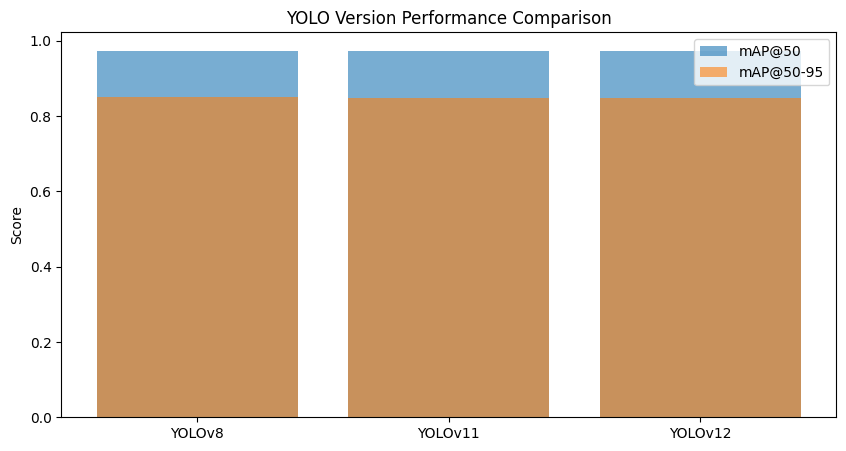

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.bar(df['Model'], df['mAP50'], label='mAP@50', alpha=0.6)
plt.bar(df['Model'], df['mAP50-95'], label='mAP@50-95', alpha=0.6)
plt.ylabel('Score')
plt.title('YOLO Version Performance Comparison')
plt.legend()
plt.show()


In [1]:
from ultralytics import YOLO
import pandas as pd

weights = {
    "YOLOv8-m": "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train16/weights/best.pt",
    "YOLOv11-m": "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train25/weights/best.pt",
    "YOLOv12-m": "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train27/weights/best.pt",
}

rows = []
for name, w in weights.items():
    m = YOLO(w)
    r = m.val(plots=True, save_json=False, conf=0.25, iou=0.6)  # same conf/IoU across all
    rows.append({
        "Model": name,
        "mAP@0.50": round(r.box.map50, 4),
        "mAP@0.50:0.95": round(r.box.map, 4),
        "Precision": round(r.box.mp, 4),   # mean precision
        "Recall": round(r.box.mr, 4),      # mean recall
        "Images/s (val)": round(1000.0 / r.speed['inference'], 2),  # if reported per image (ms)
        "Infer ms/img": round(r.speed['inference'], 2),
    })

df = pd.DataFrame(rows).sort_values("mAP@0.50:0.95", ascending=False)
df


Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1.2±0.6 MB/s, size: 21.5 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:12<00:00,  3.96it/s]


                   all        801        944      0.952       0.96      0.969      0.864
           Green Light         87        122      0.865      0.885      0.909      0.603
             Red Light         74        108      0.786      0.852      0.832      0.571
       Speed Limit 100         52         52      0.945          1      0.991      0.923
       Speed Limit 110         17         17      0.941      0.941      0.969       0.91
       Speed Limit 120         60         60          1          1      0.995      0.934
        Speed Limit 20         56         56      0.965      0.982       0.99      0.884
        Speed Limit 30         71         74      0.948      0.984       0.99      0.937
        Speed Limit 40         53         55      0.982          1      0.995      0.906
        Speed Limit 50         68         71      0.971      0.944       0.97      0.875
        Speed Limit 60         76         76      0.974      0.973      0.985      0.927
        Speed Limit 7

val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:16<00:00,  3.07it/s]


                   all        801        944      0.961      0.939      0.967      0.863
           Green Light         87        122      0.849      0.787      0.864      0.577
             Red Light         74        108        0.9      0.824      0.891      0.597
       Speed Limit 100         52         52      0.965      0.981       0.99      0.927
       Speed Limit 110         17         17          1      0.921      0.968       0.91
       Speed Limit 120         60         60      0.974          1      0.995       0.95
        Speed Limit 20         56         56      0.978      0.982       0.99      0.886
        Speed Limit 30         71         74       0.95      0.973      0.984      0.939
        Speed Limit 40         53         55      0.981      0.927      0.978      0.888
        Speed Limit 50         68         71      0.932      0.965      0.982      0.903
        Speed Limit 60         76         76      0.986      0.957       0.98      0.912
        Speed Limit 7

val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.82it/s]


                   all        801        944      0.968      0.943      0.971      0.864
           Green Light         87        122      0.931      0.769      0.894      0.592
             Red Light         74        108      0.846      0.761      0.864      0.567
       Speed Limit 100         52         52          1      0.995      0.995      0.916
       Speed Limit 110         17         17      0.932          1      0.992      0.938
       Speed Limit 120         60         60          1          1      0.995      0.939
        Speed Limit 20         56         56      0.958      0.982       0.99      0.878
        Speed Limit 30         71         74      0.961      0.973      0.985      0.945
        Speed Limit 40         53         55      0.983      0.982      0.995      0.901
        Speed Limit 50         68         71      0.971      0.952      0.977      0.898
        Speed Limit 60         76         76      0.985      0.961      0.979      0.911
        Speed Limit 7

,Model,mAP@0.50,mAP@0.50:0.95,Precision,Recall,Images/s (val),Infer ms/img
2,YOLOv12-m,0.9714,0.8642,0.9681,0.9428,53.38,18.73
0,YOLOv8-m,0.9687,0.8640,0.9516,0.9603,93.16,10.73
1,YOLOv11-m,0.9671,0.8633,0.9606,0.9392,58.59,17.07


In [2]:
import pandas as pd

def per_class_ap(model_path):
    m = YOLO(model_path)
    r = m.val(plots=False)
    cls_names = list(r.names.values())
    ap_per_class = r.box.maps  # list per-class AP@0.50:0.95
    return pd.DataFrame({"Class": cls_names, "AP@0.50:0.95": ap_per_class})

pc_v8  = per_class_ap(weights["YOLOv8-m"]).rename(columns={"AP@0.50:0.95":"YOLOv8-m"})
pc_v11 = per_class_ap(weights["YOLOv11-m"]).rename(columns={"AP@0.50:0.95":"YOLOv11-m"})
pc_v12 = per_class_ap(weights["YOLOv12-m"]).rename(columns={"AP@0.50:0.95":"YOLOv12-m"})

per_class = pc_v8.merge(pc_v11, on="Class").merge(pc_v12, on="Class")
per_class.sort_values("YOLOv12-m", ascending=False).head(15)


Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 31.4±18.2 MB/s, size: 13.3 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.64it/s]

                   all        801        944      0.951      0.956      0.973       0.85
           Green Light         87        122       0.89      0.869      0.917      0.562
             Red Light         74        108      0.796      0.829      0.821      0.533
       Speed Limit 100         52         52      0.934          1      0.991      0.913
       Speed Limit 110         17         17      0.928      0.941      0.987      0.916
       Speed Limit 120         60         60      0.987          1      0.995      0.927
        Speed Limit 20         56         56      0.967      0.982      0.987       0.86
        Speed Limit 30         71         74      0.947      0.963      0.992      0.925
        Speed Limit 40         53         55      0.987          1      0.995      0.897
        Speed Limit 50         68         71      0.975      0.944      0.989       0.87
        Speed Limit 60         76         76       0.96      0.959      0.986      0.913
        Speed Limit 7

Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLO11l summary (fused): 190 layers, 25,290,877 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 32.0±16.0 MB/s, size: 16.2 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:15<00:00,  3.29it/s]

                   all        801        944       0.96      0.939      0.974      0.849
           Green Light         87        122      0.849      0.786      0.878      0.544
             Red Light         74        108      0.894      0.824       0.87      0.546
       Speed Limit 100         52         52      0.965      0.981      0.993      0.916
       Speed Limit 110         17         17          1       0.92       0.99      0.916
       Speed Limit 120         60         60      0.974          1      0.995      0.943
        Speed Limit 20         56         56      0.978      0.982      0.987      0.865
        Speed Limit 30         71         74      0.952      0.973      0.989      0.929
        Speed Limit 40         53         55      0.981      0.927      0.991      0.883
        Speed Limit 50         68         71      0.932      0.964      0.989      0.886
        Speed Limit 60         76         76      0.986      0.956      0.984      0.901
        Speed Limit 7

Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLOv12m summary (fused): 169 layers, 20,116,477 parameters, 0 gradients, 67.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 26.4±16.4 MB/s, size: 15.5 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:16<00:00,  3.02it/s]

                   all        801        944      0.967      0.943      0.973      0.847
           Green Light         87        122      0.931      0.769      0.885      0.548
             Red Light         74        108      0.837      0.761       0.85      0.528
       Speed Limit 100         52         52          1      0.995      0.995      0.901
       Speed Limit 110         17         17      0.932          1      0.992      0.926
       Speed Limit 120         60         60      0.996          1      0.995      0.931
        Speed Limit 20         56         56      0.958      0.982      0.987      0.856
        Speed Limit 30         71         74      0.961      0.973      0.992      0.937
        Speed Limit 40         53         55      0.983      0.982      0.995      0.887
        Speed Limit 50         68         71      0.971      0.952      0.986      0.887
        Speed Limit 60         76         76      0.985      0.961      0.985      0.897
        Speed Limit 7

,Class,YOLOv8-m,YOLOv11-m,YOLOv12-m
7,Speed Limit 30,0.925231,0.929488,0.937341
14,Stop,0.949100,0.937747,0.933514
5,Speed Limit 120,0.927197,0.942642,0.930516
4,Speed Limit 110,0.915672,0.916083,0.926354
11,Speed Limit 70,0.909425,0.905200,0.922389
3,Speed Limit 100,0.912546,0.916209,0.900623
10,Speed Limit 60,0.913021,0.901024,0.896555
8,Speed Limit 40,0.897242,0.883293,0.887198
9,Speed Limit 50,0.869992,0.886447,0.886957
12,Speed Limit 80,0.898514,0.881814,0.884432


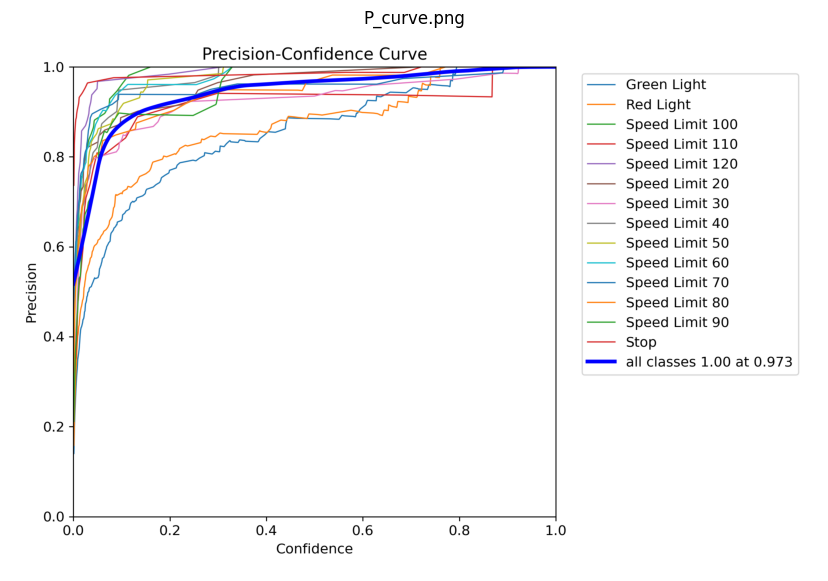

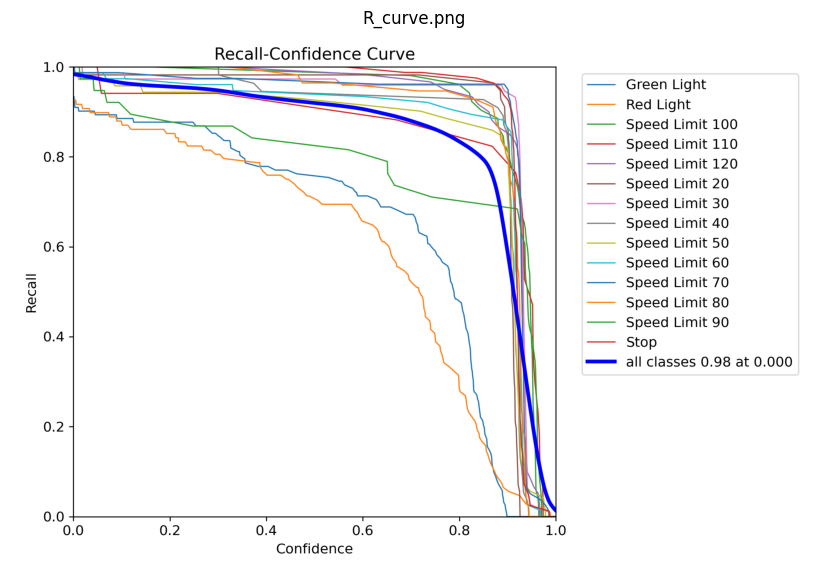

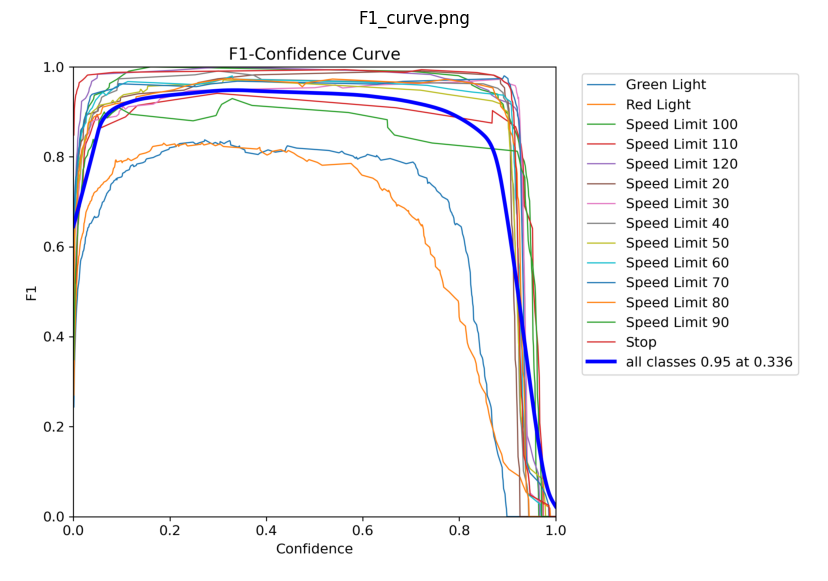

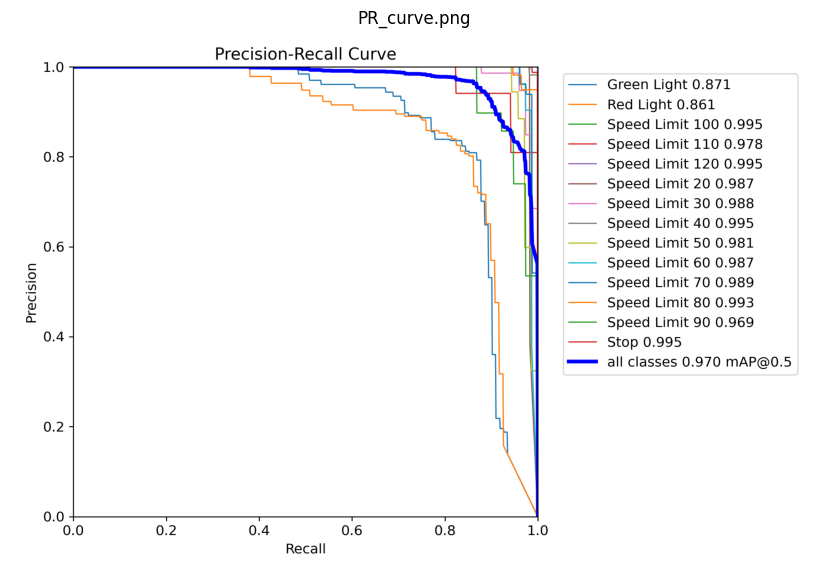

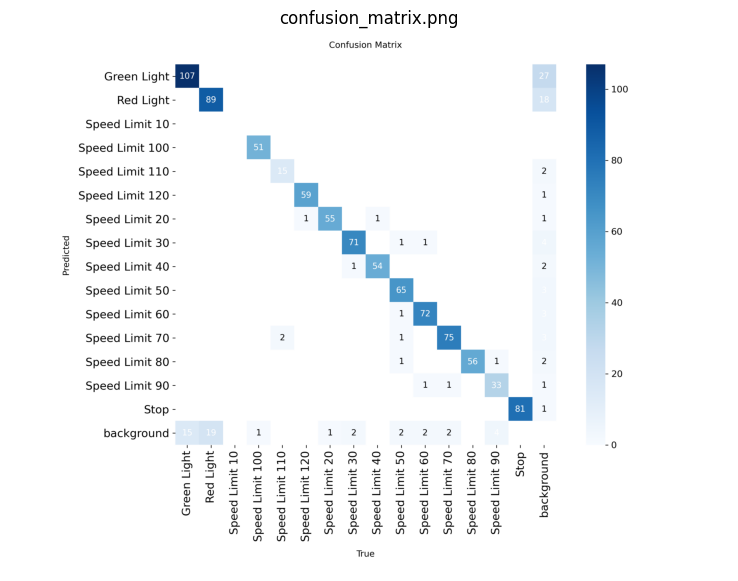

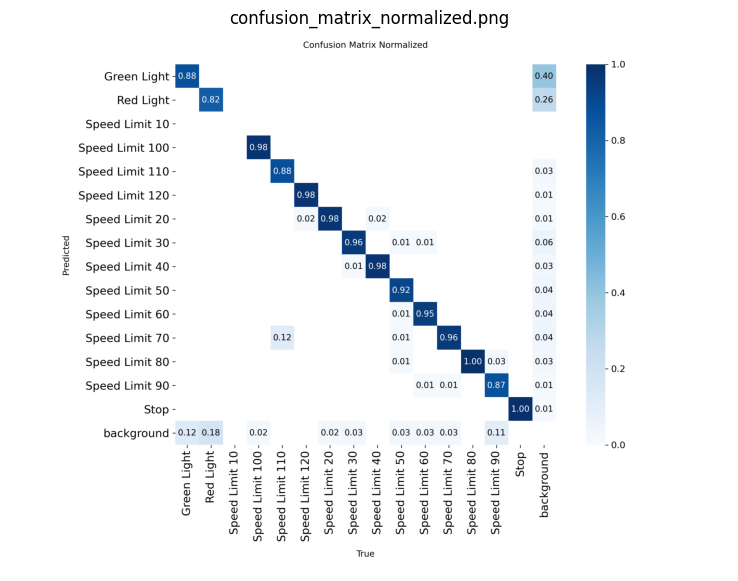

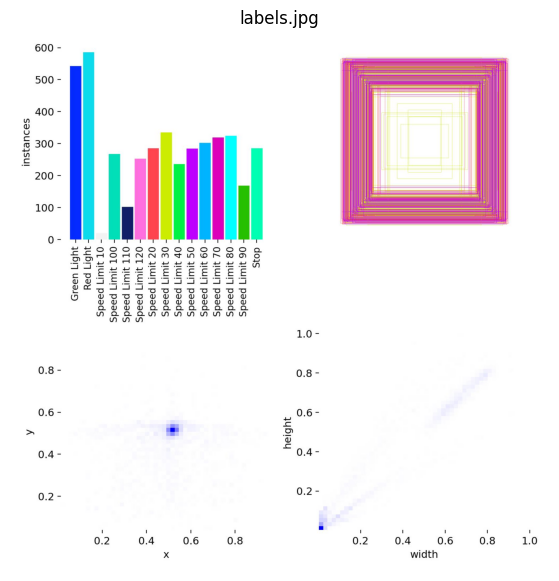

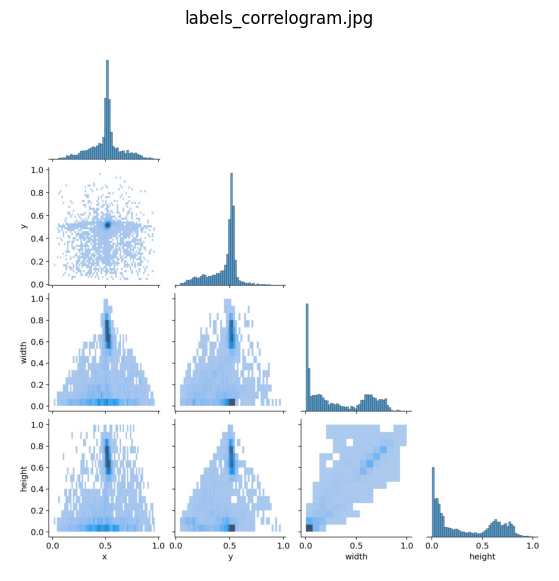

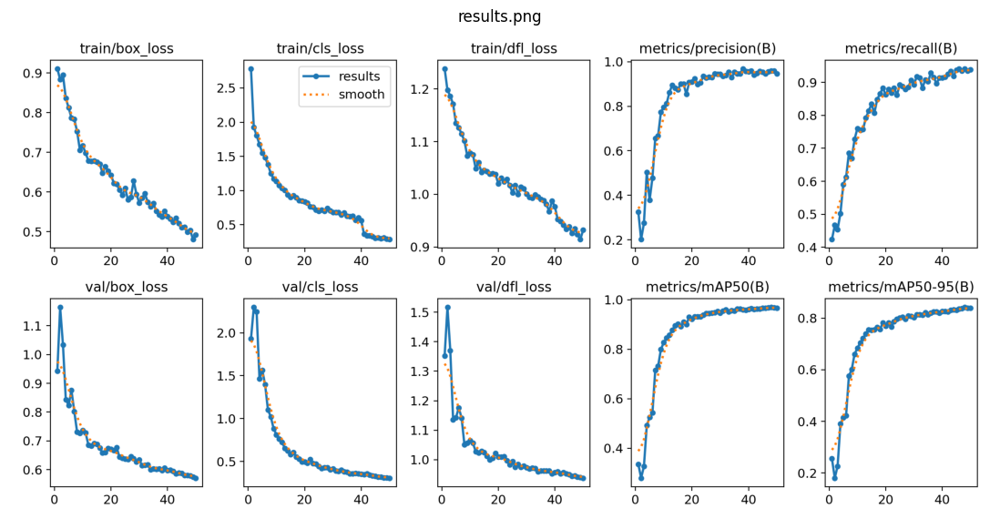

In [4]:
output_dir = "/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train"

plot_files = [
    "P_curve.png", "R_curve.png", "F1_curve.png", "PR_curve.png",
    "confusion_matrix.png", "confusion_matrix_normalized.png",
    "labels.jpg", "labels_correlogram.jpg", "results.png"
]

# Filter only existing files
existing_plots = [f for f in plot_files if os.path.exists(os.path.join(output_dir, f))]

# Show each image individually
for file in existing_plots:
    img_path = os.path.join(output_dir, file)
    img = Image.open(img_path)
    plt.figure(figsize=(15, 7))
    plt.imshow(img)
    plt.title(file)
    plt.axis('off')
    plt.show()

In [6]:
model_result=pd.read_csv("/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train/results.csv")

In [7]:
model_result.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,80.7548,0.91098,2.78382,1.23842,0.32585,0.42362,0.33584,0.25491,0.94218,1.92873,1.35236,0.000175,0.000175,0.000175
1,2,159.9300,0.88332,1.92371,1.19758,0.20183,0.46694,0.27941,0.18007,1.16393,2.29789,1.51667,0.000343,0.000343,0.000343
2,3,237.2810,0.89479,1.80576,1.18647,0.27552,0.45391,0.32698,0.22627,1.03330,2.24382,1.37020,0.000504,0.000504,0.000504
3,4,314.6920,0.83634,1.67488,1.17121,0.50326,0.50251,0.49294,0.38973,0.84394,1.46535,1.13621,0.000495,0.000495,0.000495
4,5,393.3050,0.81233,1.55022,1.13473,0.37779,0.58985,0.52457,0.41428,0.82385,1.56497,1.14276,0.000484,0.000484,0.000484


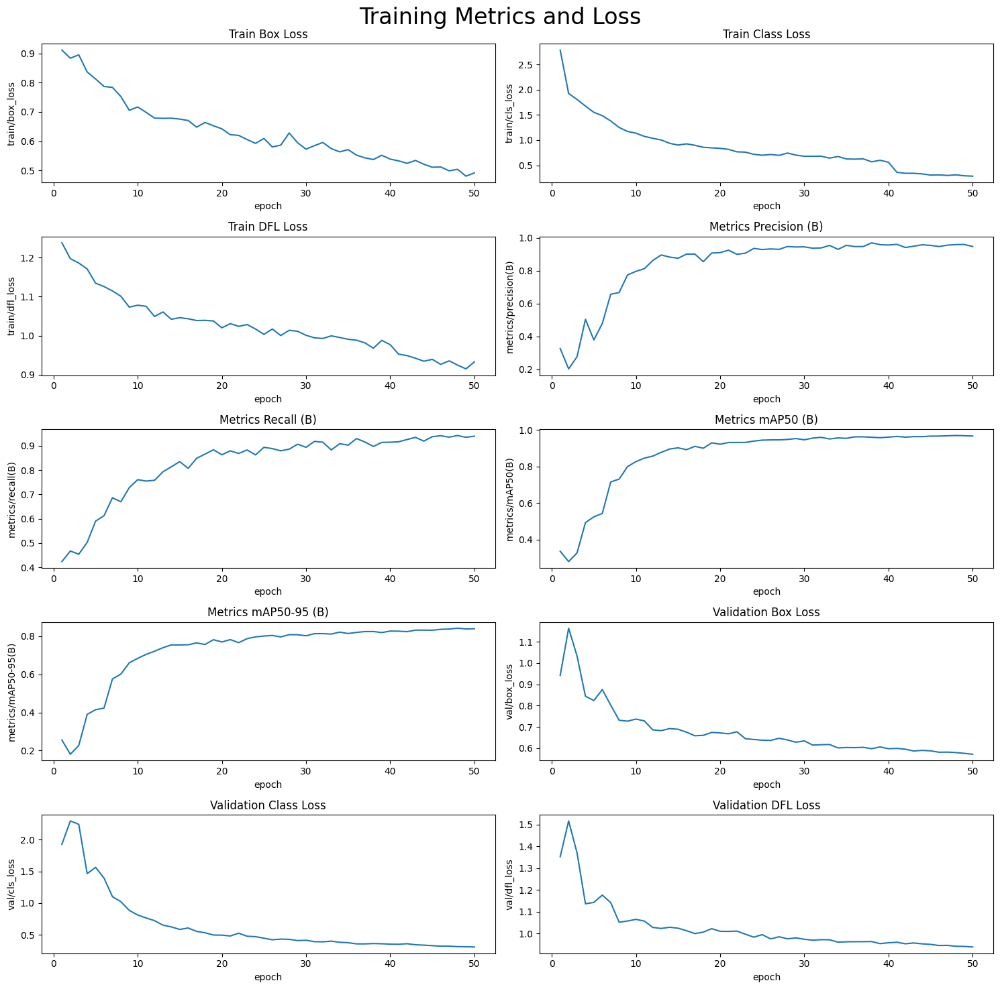

In [8]:
model_result.columns = model_result.columns.str.strip()

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=model_result, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=model_result, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=model_result, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=model_result, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=model_result, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=model_result, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=model_result, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=model_result, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=model_result, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

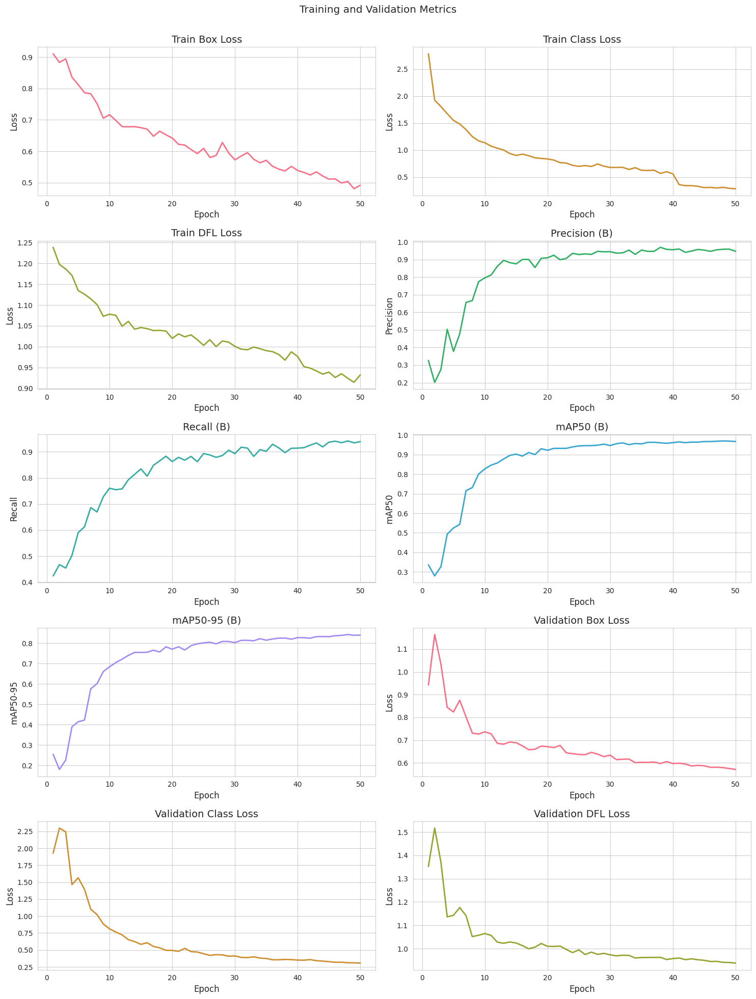

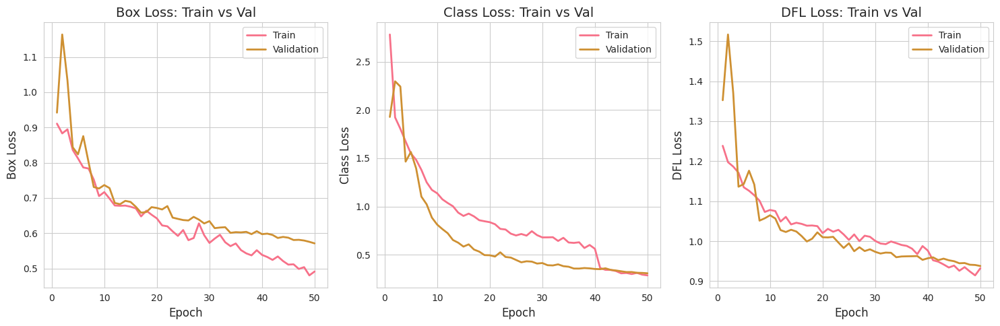

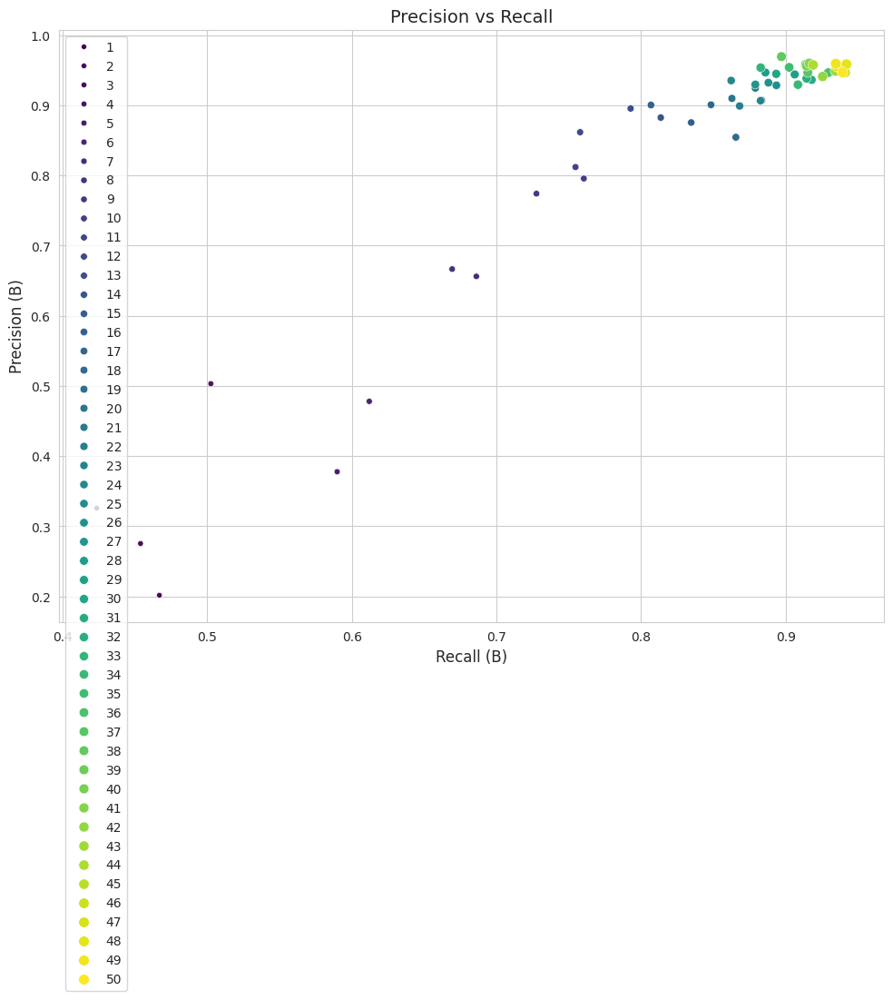

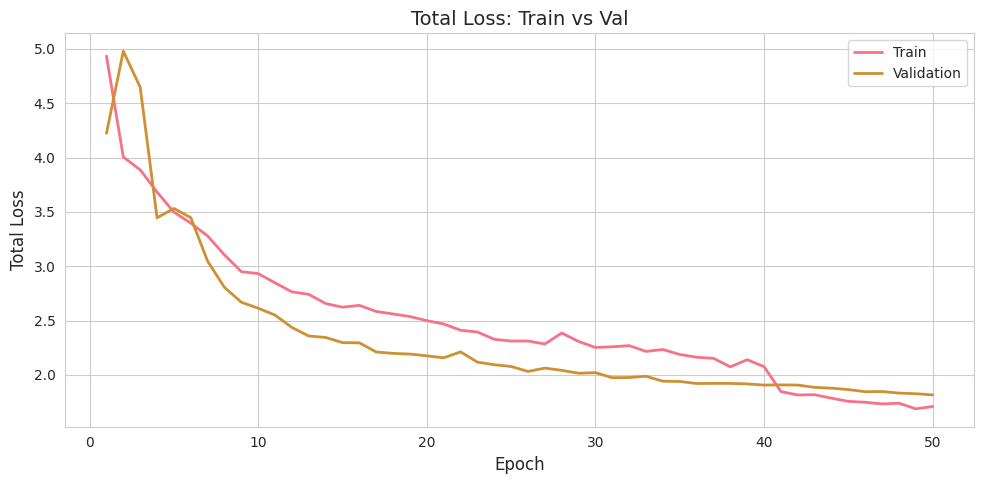

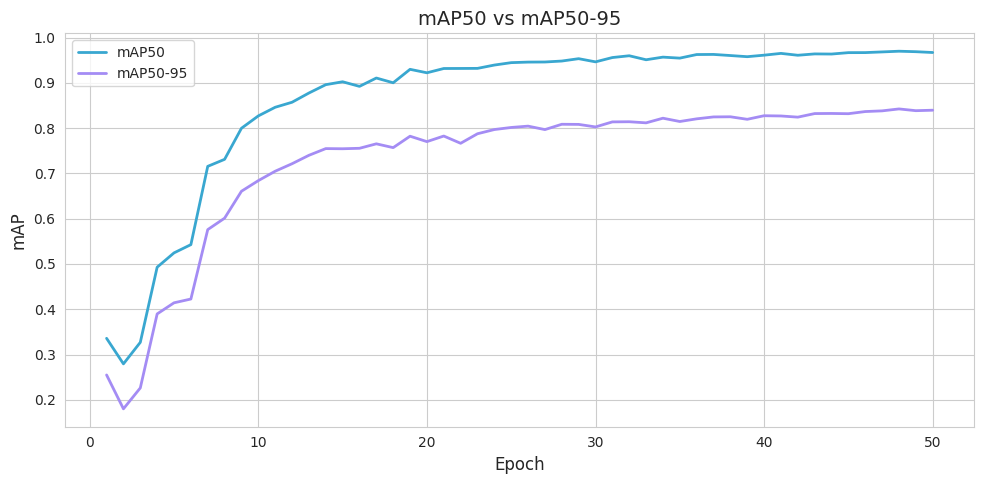

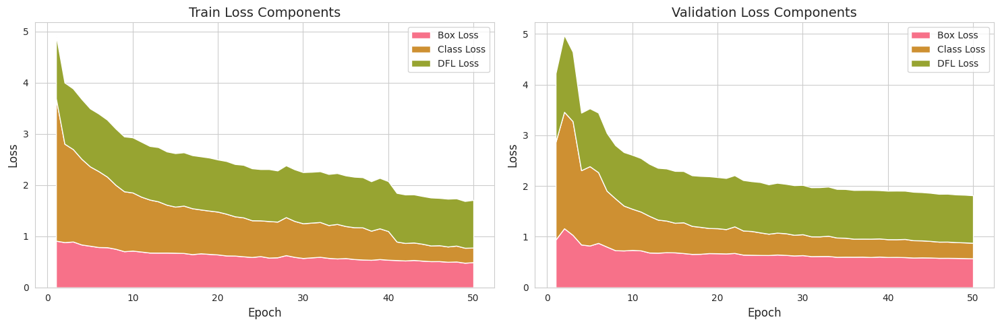

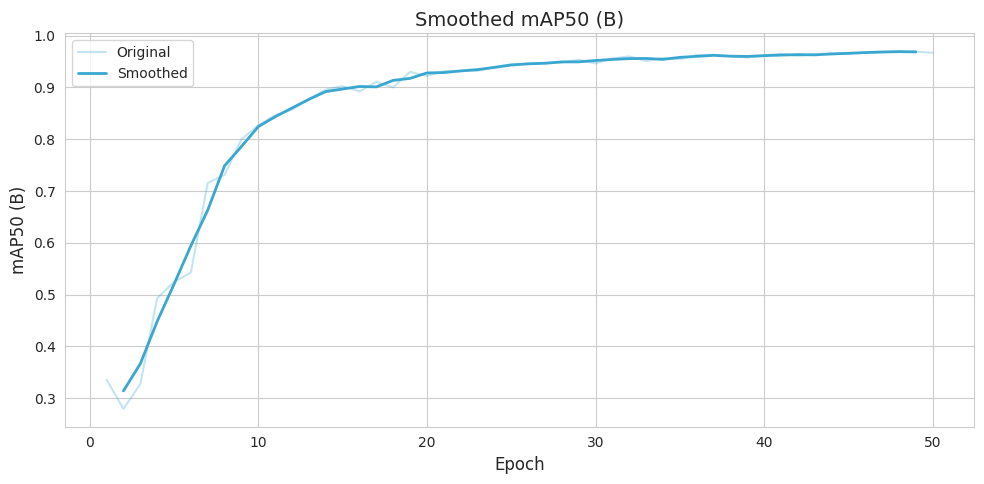

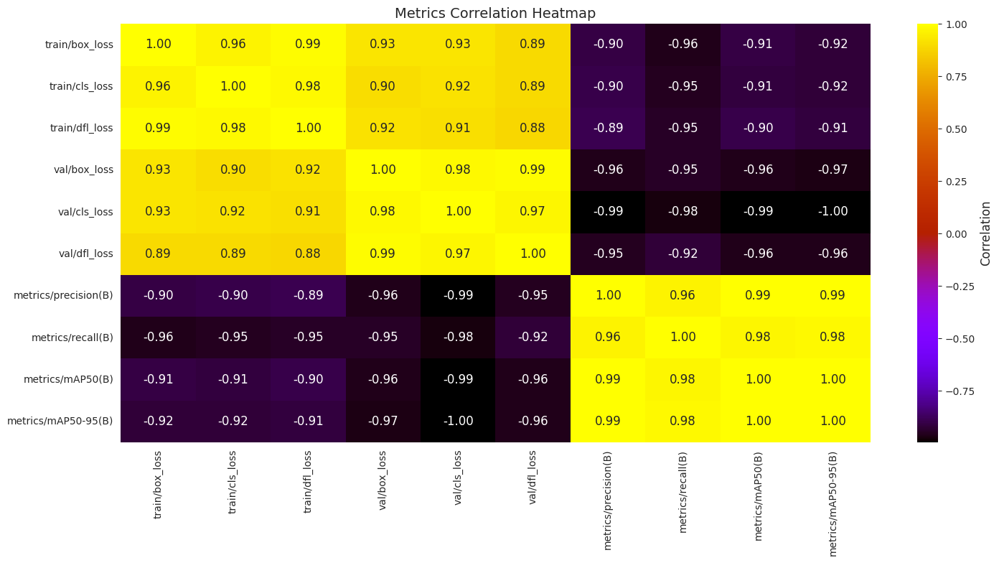

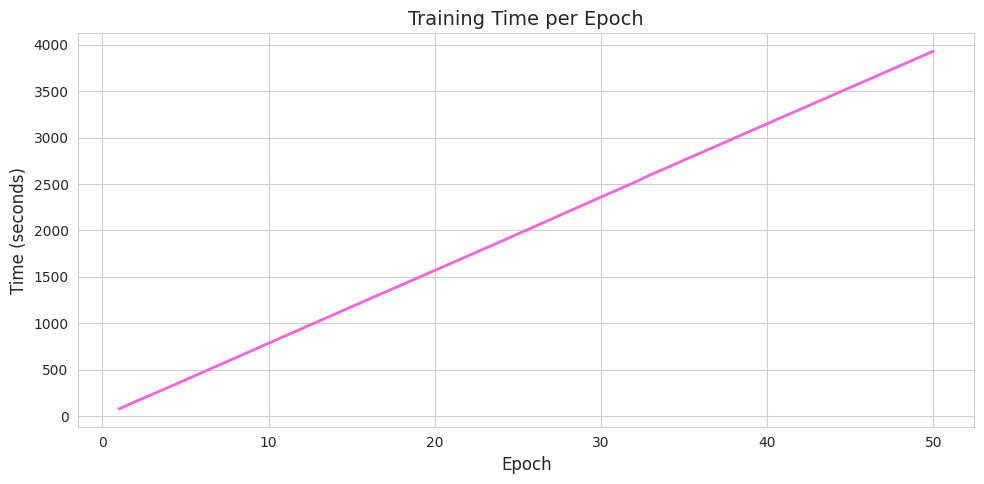

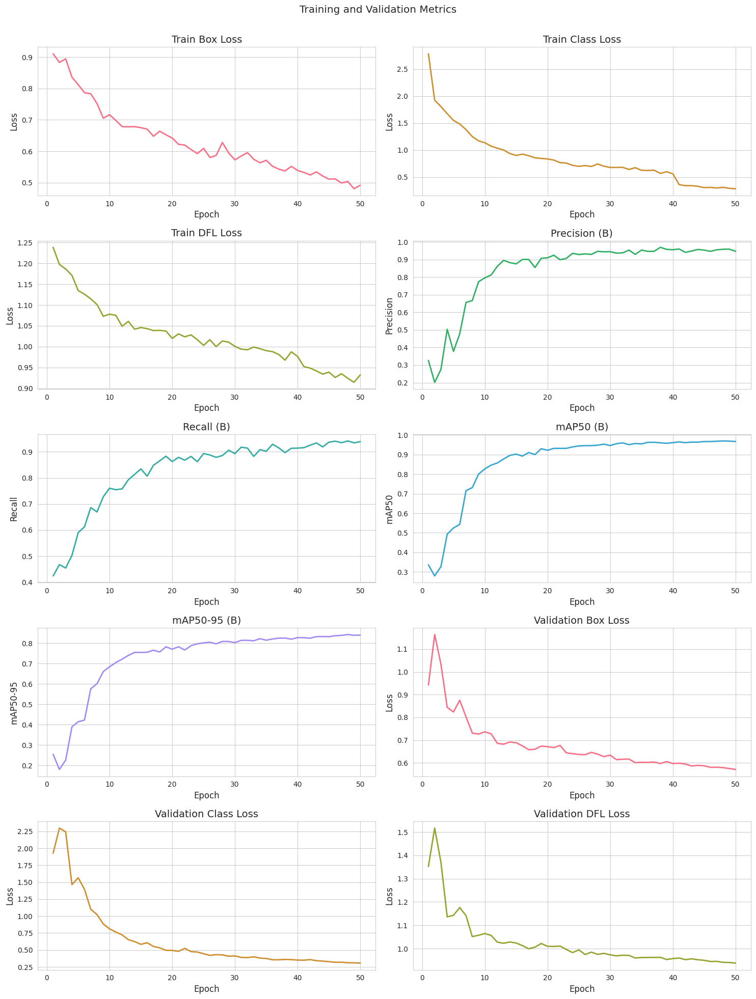

In [9]:
# Set Seaborn style for better aesthetics
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

# Define a color palette for consistency
colors = sns.color_palette("husl", 8)

# Strip whitespace from column names (just in case)
model_result.columns = model_result.columns.str.strip()

# Create figure with subplots for original plots (5 rows, 2 columns)
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 20), dpi=100)

# Original plots
sns.lineplot(x='epoch', y='train/box_loss', data=model_result, ax=axs[0, 0], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='train/cls_loss', data=model_result, ax=axs[0, 1], color=colors[1], linewidth=2)
sns.lineplot(x='epoch', y='train/dfl_loss', data=model_result, ax=axs[1, 0], color=colors[2], linewidth=2)
sns.lineplot(x='epoch', y='metrics/precision(B)', data=model_result, ax=axs[1, 1], color=colors[3], linewidth=2)
sns.lineplot(x='epoch', y='metrics/recall(B)', data=model_result, ax=axs[2, 0], color=colors[4], linewidth=2)
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, ax=axs[2, 1], color=colors[5], linewidth=2)
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=model_result, ax=axs[3, 0], color=colors[6], linewidth=2)
sns.lineplot(x='epoch', y='val/box_loss', data=model_result, ax=axs[3, 1], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/cls_loss', data=model_result, ax=axs[4, 0], color=colors[1], linewidth=2)
sns.lineplot(x='epoch', y='val/dfl_loss', data=model_result, ax=axs[4, 1], color=colors[2], linewidth=2)

# Set titles and labels
axs[0, 0].set(title='Train Box Loss', xlabel='Epoch', ylabel='Loss')
axs[0, 1].set(title='Train Class Loss', xlabel='Epoch', ylabel='Loss')
axs[1, 0].set(title='Train DFL Loss', xlabel='Epoch', ylabel='Loss')
axs[1, 1].set(title='Precision (B)', xlabel='Epoch', ylabel='Precision')
axs[2, 0].set(title='Recall (B)', xlabel='Epoch', ylabel='Recall')
axs[2, 1].set(title='mAP50 (B)', xlabel='Epoch', ylabel='mAP50')
axs[3, 0].set(title='mAP50-95 (B)', xlabel='Epoch', ylabel='mAP50-95')
axs[3, 1].set(title='Validation Box Loss', xlabel='Epoch', ylabel='Loss')
axs[4, 0].set(title='Validation Class Loss', xlabel='Epoch', ylabel='Loss')
axs[4, 1].set(title='Validation DFL Loss', xlabel='Epoch', ylabel='Loss')

# Main title and layout
plt.suptitle('Training and Validation Metrics\n\n')
plt.tight_layout()

# Additional Plots
# 1. Train vs Validation Loss Comparison
fig_comp, axs_comp = plt.subplots(1, 3, figsize=(15, 5), dpi=100)
sns.lineplot(x='epoch', y='train/box_loss', data=model_result, label='Train', ax=axs_comp[0], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/box_loss', data=model_result, label='Validation', ax=axs_comp[0], color=colors[1], linewidth=2)
axs_comp[0].set(title='Box Loss: Train vs Val', xlabel='Epoch', ylabel='Box Loss')
axs_comp[0].legend()

sns.lineplot(x='epoch', y='train/cls_loss', data=model_result, label='Train', ax=axs_comp[1], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/cls_loss', data=model_result, label='Validation', ax=axs_comp[1], color=colors[1], linewidth=2)
axs_comp[1].set(title='Class Loss: Train vs Val', xlabel='Epoch', ylabel='Class Loss')
axs_comp[1].legend()

sns.lineplot(x='epoch', y='train/dfl_loss', data=model_result, label='Train', ax=axs_comp[2], color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/dfl_loss', data=model_result, label='Validation', ax=axs_comp[2], color=colors[1], linewidth=2)
axs_comp[2].set(title='DFL Loss: Train vs Val', xlabel='Epoch', ylabel='DFL Loss')
axs_comp[2].legend()

plt.tight_layout()
plt.show()

# 2. Precision vs Recall Scatter Plot
fig_pr, ax_pr = plt.subplots(figsize=(10, 10), dpi=100)
sns.scatterplot(x='metrics/recall(B)', y='metrics/precision(B)', hue='epoch', size='epoch',palette='viridis', data=model_result, ax=ax_pr, legend='full')
ax_pr.set(title='Precision vs Recall', xlabel='Recall (B)', ylabel='Precision (B)')
plt.legend(loc="best")
plt.tight_layout()
plt.show()

# 3. Total Loss
model_result['train/total_loss'] = model_result['train/box_loss'] + model_result['train/cls_loss'] + model_result['train/dfl_loss']
model_result['val/total_loss'] = model_result['val/box_loss'] + model_result['val/cls_loss'] + model_result['val/dfl_loss']

fig_total, ax_total = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='train/total_loss', data=model_result, label='Train', ax=ax_total, color=colors[0], linewidth=2)
sns.lineplot(x='epoch', y='val/total_loss', data=model_result, label='Validation', ax=ax_total, color=colors[1], linewidth=2)
ax_total.set(title='Total Loss: Train vs Val', xlabel='Epoch', ylabel='Total Loss')
ax_total.legend()
plt.tight_layout()
plt.show()

# 4. mAP50 vs mAP50-95
fig_map, ax_map = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, label='mAP50', ax=ax_map, color=colors[5], linewidth=2)
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=model_result, label='mAP50-95', ax=ax_map, color=colors[6], linewidth=2)
ax_map.set(title='mAP50 vs mAP50-95', xlabel='Epoch', ylabel='mAP')
ax_map.legend()
plt.tight_layout()
plt.show()

# 5. Loss Components Contribution (Stacked Area Plot)
fig_stack, axs_stack = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
axs_stack[0].stackplot(model_result['epoch'],
                       model_result['train/box_loss'],
                       model_result['train/cls_loss'],
                       model_result['train/dfl_loss'],
                       labels=['Box Loss', 'Class Loss', 'DFL Loss'],
                       colors=colors[:3])
axs_stack[0].set(title='Train Loss Components', xlabel='Epoch', ylabel='Loss')
axs_stack[0].legend(loc='upper right')

axs_stack[1].stackplot(model_result['epoch'],
                       model_result['val/box_loss'],
                       model_result['val/cls_loss'],
                       model_result['val/dfl_loss'],
                       labels=['Box Loss', 'Class Loss', 'DFL Loss'],
                       colors=colors[:3])
axs_stack[1].set(title='Validation Loss Components', xlabel='Epoch', ylabel='Loss')
axs_stack[1].legend(loc='upper right')
plt.tight_layout()
plt.show()

# 6. Smoothed Metrics (e.g., mAP50)
model_result_smoothed = model_result.rolling(window=3, center=True).mean()
fig_smooth, ax_smooth = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, label='Original', alpha=0.3, ax=ax_smooth, color=colors[5])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result_smoothed, label='Smoothed', ax=ax_smooth, color=colors[5], linewidth=2)
ax_smooth.set(title='Smoothed mAP50 (B)', xlabel='Epoch', ylabel='mAP50 (B)')
ax_smooth.legend()
plt.tight_layout()
plt.show()

# 7. Metrics Correlation Heatmap
metrics_cols = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss', 
                'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 
                'metrics/precision(B)', 'metrics/recall(B)', 
                'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
correlation_matrix = model_result[metrics_cols].corr()

fig_corr, ax_corr = plt.subplots(figsize=(15, 8), dpi=100)
sns.heatmap(correlation_matrix, annot=True, cmap='gnuplot', fmt='.2f', ax=ax_corr, cbar_kws={'label': 'Correlation'})
ax_corr.set(title='Metrics Correlation Heatmap')
plt.tight_layout()
plt.show()

# 8. Training Time Plot (using 'time' column)
fig_time, ax_time = plt.subplots(figsize=(10, 5), dpi=100)
sns.lineplot(x='epoch', y='time', data=model_result, ax=ax_time, color=colors[7], linewidth=2)
ax_time.set(title='Training Time per Epoch', xlabel='Epoch', ylabel='Time (seconds)')
plt.tight_layout()
plt.show()

# Display the original plot
plt.figure(fig)
plt.show()

In [10]:
best_model="/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train/weights/best.pt"
test_model=YOLO(best_model)
metrics=test_model.val(split="test")


for metric_name, value in metrics.results_dict.items():
    print(f"{metric_name}: {value}")

Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLO11m summary (fused): 125 layers, 20,041,597 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1.5±0.7 MB/s, size: 19.9 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/test/labels... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:01<00:00, 516.96it/s]


val: New cache created: /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:12<00:00,  3.31it/s]


                   all        638        770      0.929       0.94      0.953      0.821
           Green Light         77        110      0.866      0.882      0.917      0.576
             Red Light         71         94      0.827      0.713      0.793      0.504
        Speed Limit 10          2          3      0.651          1       0.83      0.664
       Speed Limit 100         45         46      0.978          1      0.995      0.883
       Speed Limit 110         21         21      0.881      0.905      0.918      0.838
       Speed Limit 120         40         44      0.959          1      0.985      0.891
        Speed Limit 20         46         46          1      0.978      0.981      0.884
        Speed Limit 30         60         60      0.966      0.941      0.985      0.906
        Speed Limit 40         51         53      0.974      0.962      0.985      0.874
        Speed Limit 50         47         50       0.92       0.92      0.963      0.864
        Speed Limit 6


0: 640x640 1 Red Light, 16.7ms
Speed: 4.0ms preprocess, 16.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 50, 16.8ms
Speed: 2.9ms preprocess, 16.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Green Lights, 16.7ms
Speed: 1.6ms preprocess, 16.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 16.7ms
Speed: 1.4ms preprocess, 16.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 16.7ms
Speed: 1.5ms preprocess, 16.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 100, 16.7ms
Speed: 1.8ms preprocess, 16.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 110, 15.4ms
Speed: 1.3ms preprocess, 15.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 15.3ms
Speed: 1.6ms preprocess, 15.3ms inf

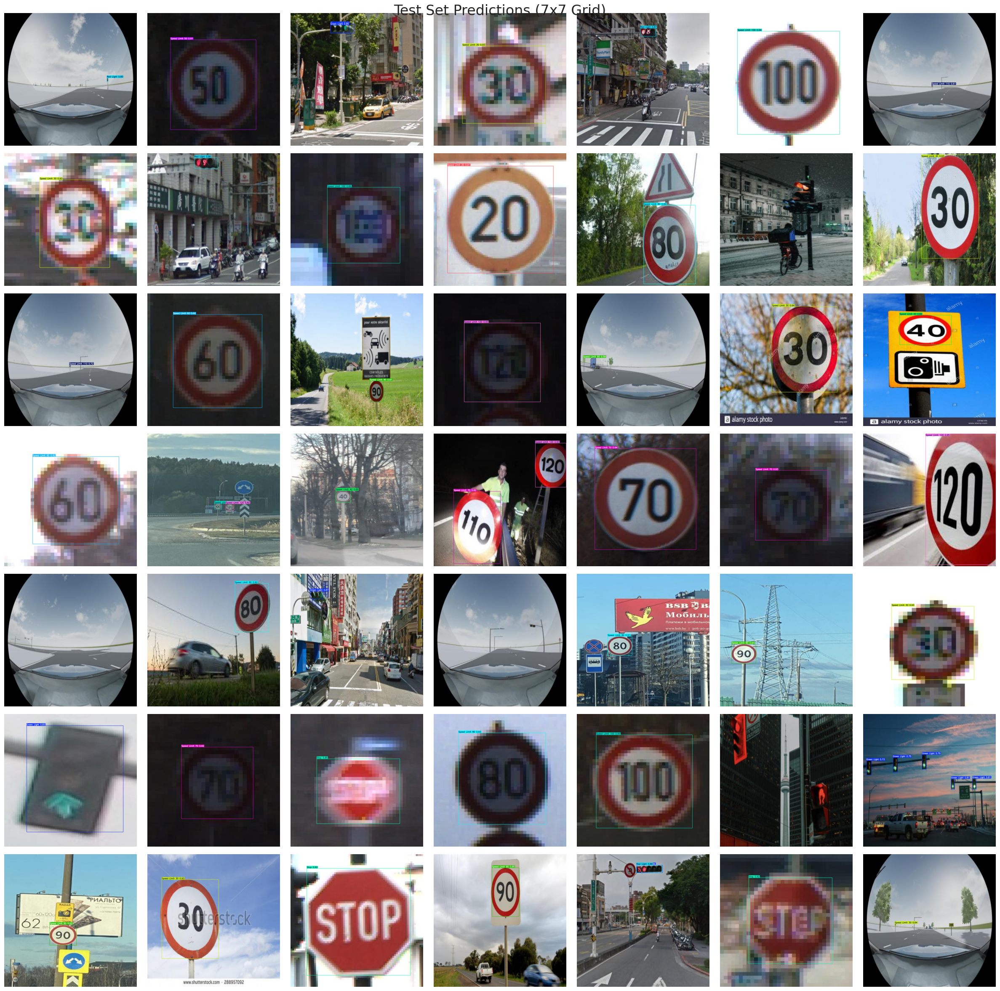

In [12]:
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

test_images_path = '/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/test/images'
image_files = [f for f in os.listdir(test_images_path) if f.lower().endswith('.jpg')]

step = max(1, len(image_files) // 49)
selected_images = image_files[::step][:49]

fig, axes = plt.subplots(7, 7, figsize=(24, 24))
fig.suptitle('Test Set Predictions (7x7 Grid)', fontsize=24)

for ax, img_name in zip(axes.flatten(), selected_images):
    img_path = os.path.join(test_images_path, img_name)
    img = cv2.imread(img_path)
    if img is not None:
        img_resized = resize_image(img)
        results = test_model.predict(source=img_resized, imgsz=640, conf=0.5)
        annotated = results[0].plot(line_width=1)
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
    else:
        ax.text(0.5, 0.5, 'Load failed', ha='center', va='center')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [2]:
from ultralytics import YOLO

# === Paths ===
WEIGHTS = '/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/runs/detect/train26/weights/best.pt'
DATA_YAML = '/home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/data.yaml'

# === Eval settings ===
IMGSZ = 640        # use what you trained with (e.g., 832/960/1024)
DEVICE = 0         # GPU id; use 'cpu' if no GPU
# BATCH: omit or set to 0 for auto. Only set a number if you hit OOM.
# BATCH = 0

# Load model
model = YOLO(WEIGHTS)

# Evaluate on TEST split (quiet output)
results = model.val(
    data=DATA_YAML,
    split='test',
    imgsz=IMGSZ,
    device=DEVICE,
    verbose=False,    # hides long confusion-matrix dumps
    # batch=BATCH,    # uncomment if you want to force a batch size
)

# --- Pretty print key metrics ---
try:
    print(f"Pose mAP50:     {results.pose.map50:.3f}")
    print(f"Pose mAP50-95:  {results.pose.map:.3f}")
    print(f"Box  mAP50:     {results.box.map50:.3f}")
    print(f"Box  mAP50-95:  {results.box.map:.3f}")
except Exception:
    print(results)  # fallback print if structure differs

# Optional: save qualitative predictions for a quick visual check
# model.predict(
#     source='/home/hpc/iwi5/iwi5299h/MLR/unzipped_dataset/wing/test/images',
#     imgsz=IMGSZ,
#     device=DEVICE,
#     save=True, save_txt=True, save_conf=True,
#     project='projects/cicada_baseline',
#     name='M_LR_test_predictions'
# )


Ultralytics 8.3.151 🚀 Python-3.12.10 torch-2.6.0 CUDA:0 (NVIDIA GeForce GTX 1080 Ti, 11165MiB)
YOLO11l summary (fused): 190 layers, 25,290,877 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1.3±0.8 MB/s, size: 21.5 KB)


val: Scanning /home/hpc/iwi5/iwi5299h/Traffic_YOLO11/unzipped_data/car/test/labels.cache... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:14<00:00,  2.80it/s]


                   all        638        770      0.956      0.921       0.96      0.831
Speed: 0.5ms preprocess, 17.0ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val14
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x792d625ef380>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    